In [8]:
# ==========================================================
# Saturation baseline experiment
# Step 1: repeat Saturation only 1000 times
# Step 2: compare with original No saturation vs Saturation metric difference
# ==========================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

from scipy.stats import pearsonr, spearmanr
from scipy.spatial.distance import pdist, squareform
from statsmodels.nonparametric.smoothers_lowess import lowess


# ==========================================================
# Optional: MIC / MAS / MEV / MCN
# ==========================================================

try:
    from minepy import MINE
    HAS_MINEPY = True
except Exception:
    HAS_MINEPY = False
    print("minepy is not installed. MIC/MAS/MEV/MCN will be skipped.")


# ==========================================================
# 1. Data generation
# Use your original Saturation / No saturation formulas
# ==========================================================

def generate_saturation_data_original_formula(
    seed,
    n=180,
    noise_sd=0.035,
    x_random=False,
):
    """
    Generate one saturation dataset using the original saturation formula.

    Saturation:
        y = 0.14 + 0.76 * (1 - exp(-4.5 * x))

    Random seed controls:
        1. x positions if x_random=True
        2. random noise around the saturation curve
    """

    rng = np.random.default_rng(seed)

    if x_random:
        x = np.sort(rng.uniform(0, 1, n))
    else:
        x = np.linspace(0, 1, n)

    y_base = 0.14 + 0.76 * (1 - np.exp(-4.5 * x))
    y = y_base + rng.normal(0, noise_sd, n)

    return x, y


def generate_original_no_saturation_and_saturation(
    n=180,
):
    """
    Generate the original deterministic No saturation and Saturation curves.
    This follows your original setting:

    if prop == "Saturation":
        return (
            (xx, 0.14 + 0.76 * xx),
            (xx, 0.14 + 0.76 * (1 - np.exp(-4.5 * xx))),
        )
    """

    xx = np.linspace(0, 1, n)

    x_no_sat = xx
    y_no_sat = 0.14 + 0.76 * xx

    x_sat = xx
    y_sat = 0.14 + 0.76 * (1 - np.exp(-4.5 * xx))

    return x_no_sat, y_no_sat, x_sat, y_sat


# ==========================================================
# 2. Metric helper functions
# ==========================================================

def safe_pearson(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 3 or np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return np.nan

    return pearsonr(x, y)[0]


def safe_spearman(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 3 or np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return np.nan

    return spearmanr(x, y)[0]


def distance_correlation(x, y):
    x = np.asarray(x, dtype=float).reshape(-1, 1)
    y = np.asarray(y, dtype=float).reshape(-1, 1)

    valid = np.isfinite(x[:, 0]) & np.isfinite(y[:, 0])
    x = x[valid]
    y = y[valid]

    if len(x) < 3:
        return np.nan

    a = squareform(pdist(x, metric="euclidean"))
    b = squareform(pdist(y, metric="euclidean"))

    A = a - a.mean(axis=0)[None, :] - a.mean(axis=1)[:, None] + a.mean()
    B = b - b.mean(axis=0)[None, :] - b.mean(axis=1)[:, None] + b.mean()

    dcov2_xy = np.mean(A * B)
    dcov2_xx = np.mean(A * A)
    dcov2_yy = np.mean(B * B)

    if dcov2_xx <= 0 or dcov2_yy <= 0:
        return np.nan

    return np.sqrt(dcov2_xy / np.sqrt(dcov2_xx * dcov2_yy))


def compute_mine_metrics(x, y):
    empty = {
        "MIC": np.nan,
        "MAS": np.nan,
        "MEV": np.nan,
        "MCN": np.nan,
        "MIC-r2": np.nan,
    }

    if not HAS_MINEPY:
        return empty

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return empty

    mine = MINE(alpha=0.6, c=15)
    mine.compute_score(x, y)

    mic = mine.mic()
    mas = mine.mas()
    mev = mine.mev()
    mcn = mine.mcn()

    r = safe_pearson(x, y)
    r2 = r ** 2 if np.isfinite(r) else np.nan

    return {
        "MIC": mic,
        "MAS": mas,
        "MEV": mev,
        "MCN": mcn,
        "MIC-r2": mic - r2 if np.isfinite(r2) else np.nan,
    }


def minmax01(v):
    v = np.asarray(v, dtype=float)

    v_min = np.nanmin(v)
    v_max = np.nanmax(v)

    if not np.isfinite(v_min) or not np.isfinite(v_max):
        return np.full_like(v, np.nan)

    if v_max == v_min:
        return np.full_like(v, np.nan)

    return (v - v_min) / (v_max - v_min)


def segment_slope_fit(x_seg, y_seg):
    x_seg = np.asarray(x_seg, dtype=float)
    y_seg = np.asarray(y_seg, dtype=float)

    valid = np.isfinite(x_seg) & np.isfinite(y_seg)
    x_seg = x_seg[valid]
    y_seg = y_seg[valid]

    if len(x_seg) < 3 or np.nanstd(x_seg) == 0:
        return np.nan

    return np.polyfit(x_seg, y_seg, 1)[0]


def compute_segment_slopes(x, y, standardized=False):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 6:
        return np.nan, np.nan, np.nan, np.nan

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    if standardized:
        x = minmax01(x)
        y = minmax01(y)

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = segment_slope_fit(x, y)
    early = segment_slope_fit(x[:i1], y[:i1])
    middle = segment_slope_fit(x[i1:i2], y[i1:i2])
    late = segment_slope_fit(x[i2:], y[i2:])

    return overall, early, middle, late


def compute_x_bin_count_cv(x, n_bins=10):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]

    if len(x) == 0:
        return np.nan

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    counts = pd.Series(bins).value_counts().sort_index()
    counts = counts.reindex(np.arange(n_bins), fill_value=0)

    mean_count = counts.mean()
    sd_count = counts.std(ddof=1)

    if mean_count == 0:
        return np.nan

    return sd_count / mean_count


def compute_bin_metrics(x, y, n_bins=10, min_count_per_bin=3):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    empty_result = {
        "amplitude": np.nan,
        "eta squared": np.nan,
        "buffer width mean": np.nan,
        "early buffer width": np.nan,
        "middle buffer width": np.nan,
        "late buffer width": np.nan,
    }

    if len(x) < n_bins:
        return empty_result

    y_sd = np.nanstd(y, ddof=1)

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    df = pd.DataFrame({
        "x": x,
        "y": y,
        "bin": bins,
    }).dropna()

    if df.empty:
        return empty_result

    bin_stats = []

    for bin_id, g in df.groupby("bin", observed=True):

        if len(g) < min_count_per_bin:
            continue

        y_min = g["y"].min()
        y_max = g["y"].max()

        bin_stats.append({
            "bin": bin_id,
            "x_mean": g["x"].mean(),
            "y_mean": g["y"].mean(),
            "y_min": y_min,
            "y_max": y_max,
            "buffer_width": y_max - y_min,
            "count": len(g),
        })

    if len(bin_stats) < 3:
        return empty_result

    bin_df = (
        pd.DataFrame(bin_stats)
        .sort_values("x_mean")
        .reset_index(drop=True)
    )

    amplitude = bin_df["y_mean"].max() - bin_df["y_mean"].min()

    if y_sd == 0 or not np.isfinite(y_sd):
        bin_df["buffer_width_scaled"] = np.nan
    else:
        bin_df["buffer_width_scaled"] = bin_df["buffer_width"] / y_sd

    y_global_mean = df["y"].mean()
    ss_total = np.sum((df["y"] - y_global_mean) ** 2)

    ss_between = 0.0

    for _, g in df.groupby("bin", observed=True):
        if len(g) < min_count_per_bin:
            continue

        y_bin_mean = g["y"].mean()
        ss_between += len(g) * (y_bin_mean - y_global_mean) ** 2

    eta_squared = ss_between / ss_total if ss_total > 0 else np.nan

    n_valid_bins = len(bin_df)
    i1 = n_valid_bins // 3
    i2 = 2 * n_valid_bins // 3

    buffer_mean = bin_df["buffer_width_scaled"].mean()
    buffer_early = bin_df.iloc[:i1]["buffer_width_scaled"].mean()
    buffer_middle = bin_df.iloc[i1:i2]["buffer_width_scaled"].mean()
    buffer_late = bin_df.iloc[i2:]["buffer_width_scaled"].mean()

    return {
        "amplitude": amplitude,
        "eta squared": eta_squared,
        "buffer width mean": buffer_mean,
        "early buffer width": buffer_early,
        "middle buffer width": buffer_middle,
        "late buffer width": buffer_late,
    }


def compute_lowess_metrics(x, y, frac=0.25):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    empty_result = {
        "residual sd": np.nan,
        "curve amplitude": np.nan,
        "r2": np.nan,
        "first derivative sign changes": np.nan,
    }

    if len(x) < 10:
        return empty_result

    order = np.argsort(x)
    x_sorted = x[order]
    y_sorted = y[order]

    fitted = lowess(
        endog=y_sorted,
        exog=x_sorted,
        frac=frac,
        return_sorted=True,
    )

    x_fit = fitted[:, 0]
    y_fit = fitted[:, 1]

    y_pred = np.interp(x_sorted, x_fit, y_fit)

    residual = y_sorted - y_pred
    residual_sd = np.nanstd(residual, ddof=1)

    curve_amplitude = np.nanmax(y_fit) - np.nanmin(y_fit)

    ss_res = np.sum((y_sorted - y_pred) ** 2)
    ss_tot = np.sum((y_sorted - np.nanmean(y_sorted)) ** 2)

    r2 = 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

    dx = np.gradient(x_fit)
    dy = np.gradient(y_fit)

    with np.errstate(divide="ignore", invalid="ignore"):
        derivative = dy / dx

    sign = np.sign(derivative)
    sign[sign == 0] = np.nan

    valid_sign = np.isfinite(sign)

    if valid_sign.sum() < 2:
        sign_changes = np.nan
    else:
        sign_valid = sign[valid_sign]
        sign_changes = np.sum(sign_valid[1:] != sign_valid[:-1])

    return {
        "residual sd": residual_sd,
        "curve amplitude": curve_amplitude,
        "r2": r2,
        "first derivative sign changes": sign_changes,
    }


# ==========================================================
# 3. Compute all metrics
# ==========================================================

def compute_all_metrics(x, y):
    metrics = {}

    metrics["pearson r"] = safe_pearson(x, y)
    metrics["spearman rho"] = safe_spearman(x, y)
    metrics["distance correlation"] = distance_correlation(x, y)

    (
        metrics["raw overall slope"],
        metrics["raw early slope"],
        metrics["raw middle slope"],
        metrics["raw late slope"],
    ) = compute_segment_slopes(x, y, standardized=False)

    (
        metrics["standardized overall slope"],
        metrics["standardized early slope"],
        metrics["standardized middle slope"],
        metrics["standardized late slope"],
    ) = compute_segment_slopes(x, y, standardized=True)

    metrics.update(compute_mine_metrics(x, y))

    metrics.update(compute_bin_metrics(x, y))

    metrics["x bin count coefficient of variation"] = compute_x_bin_count_cv(x)

    metrics.update(compute_lowess_metrics(x, y))

    return metrics


# ==========================================================
# 4. Original No saturation vs Saturation results
# Use the table you provided
# ==========================================================

# original_metric_values = {
#     "pearson r": {
#         "No saturation": 0.9857,
#         "Saturation": 0.8709,
#     },
#     "spearman rho": {
#         "No saturation": 0.9866,
#         "Saturation": 0.9170,
#     },
#     "distance correlation": {
#         "No saturation": 0.9842,
#         "Saturation": 0.8992,
#     },
#     "raw overall slope": {
#         "No saturation": 0.7067,
#         "Saturation": 0.6693,
#     },
#     "raw early slope": {
#         "No saturation": 0.5978,
#         "Saturation": 1.3354,
#     },
#     "raw middle slope": {
#         "No saturation": 0.5066,
#         "Saturation": 0.0368,
#     },
#     "raw late slope": {
#         "No saturation": 0.4970,
#         "Saturation": -0.0470,
#     },
#     "standardized overall slope": {
#         "No saturation": 0.8169,
#         "Saturation": 0.8280,
#     },
#     "standardized early slope": {
#         "No saturation": 0.6910,
#         "Saturation": 1.6519,
#     },
#     "standardized middle slope": {
#         "No saturation": 0.5856,
#         "Saturation": 0.0455,
#     },
#     "standardized late slope": {
#         "No saturation": 0.5745,
#         "Saturation": -0.0582,
#     },
#     "MIC": {
#         "No saturation": 0.9838,
#         "Saturation": 0.9027,
#     },
#     "MAS": {
#         "No saturation": 0.0286,
#         "Saturation": 0.0294,
#     },
#     "MEV": {
#         "No saturation": 0.9838,
#         "Saturation": 0.9027,
#     },
#     "MCN": {
#         "No saturation": 4.3219,
#         "Saturation": 4.3219,
#     },
#     "MIC-r2": {
#         "No saturation": 0.0123,
#         "Saturation": 0.1443,
#     },
#     "amplitude": {
#         "No saturation": 3.0171,
#         "Saturation": 3.0716,
#     },
#     "eta squared": {
#         "No saturation": 0.9604,
#         "Saturation": 0.9430,
#     },
#     "buffer width mean": {
#         "No saturation": 0.5739,
#         "Saturation": 0.6589,
#     },
#     "early buffer width": {
#         "No saturation": 0.6527,
#         "Saturation": 0.8887,
#     },
#     "middle buffer width": {
#         "No saturation": 0.4971,
#         "Saturation": 0.5997,
#     },
#     "late buffer width": {
#         "No saturation": 0.5723,
#         "Saturation": 0.5309,
#     },
#     "x bin count coefficient of variation": {
#         "No saturation": 0.0000,
#         "Saturation": 0.0000,
#     },
#     "residual sd": {
#         "No saturation": 0.1667,
#         "Saturation": 0.1745,
#     },
#     "curve amplitude": {
#         "No saturation": 3.3301,
#         "Saturation": 3.5946,
#     },
#     "r2": {
#         "No saturation": 0.9722,
#         "Saturation": 0.9695,
#     },
#     "first derivative sign changes": {
#         "No saturation": 0.0000,
#         "Saturation": 1.0000,
#     },
# }


# original_observed_records = []

# for metric, values in original_metric_values.items():
#     no_sat_value = values["No saturation"]
#     sat_value = values["Saturation"]

#     original_observed_records.append({
#         "metric": metric,
#         "no_saturation_value": no_sat_value,
#         "saturation_value": sat_value,
#         "observed_difference": abs(sat_value - no_sat_value),
#     })

# original_observed_df = pd.DataFrame(original_observed_records)


# # ==========================================================
# # 5. Step 1: Repeat Saturation only
# # ==========================================================

# n_runs = 1000
# noise_sd = 0.035
# x_random = False

# baseline_records = []

# for seed in range(n_runs):

#     x_sat, y_sat = generate_saturation_data_original_formula(
#         seed=seed,
#         n=180,
#         noise_sd=noise_sd,
#         x_random=x_random,
#     )

#     metrics = compute_all_metrics(x_sat, y_sat)
#     metrics["seed"] = seed

#     baseline_records.append(metrics)

# baseline_saturation_df = pd.DataFrame(baseline_records)


# # ==========================================================
# # 6. Baseline summary
# # ==========================================================

# baseline_summary_records = []

# metric_names = [
#     c for c in baseline_saturation_df.columns
#     if c != "seed"
# ]

# for metric in metric_names:

#     values = (
#         baseline_saturation_df[metric]
#         .replace([np.inf, -np.inf], np.nan)
#         .dropna()
#     )

#     if len(values) == 0:
#         continue

#     q025 = values.quantile(0.025)
#     q975 = values.quantile(0.975)

#     baseline_summary_records.append({
#         "metric": metric,
#         "baseline_mean": values.mean(),
#         "baseline_sd": values.std(ddof=1),
#         "baseline_min": values.min(),
#         "baseline_max": values.max(),
#         "baseline_range": values.max() - values.min(),
#         "baseline_q025": q025,
#         "baseline_q975": q975,
#         "baseline_95_width": q975 - q025,
#     })

# baseline_summary_df = pd.DataFrame(baseline_summary_records)


# # ==========================================================
# # 7. Compare original observed difference with saturation baseline
# # ==========================================================

# comparison_df = original_observed_df.merge(
#     baseline_summary_df,
#     on="metric",
#     how="left",
# )

# comparison_df["ratio_to_baseline_95_width"] = (
#     comparison_df["observed_difference"]
#     / comparison_df["baseline_95_width"]
# )

# comparison_df["ratio_to_baseline_sd"] = (
#     comparison_df["observed_difference"]
#     / comparison_df["baseline_sd"]
# )

# comparison_df["larger_than_baseline_95_width"] = (
#     comparison_df["observed_difference"]
#     > comparison_df["baseline_95_width"]
# )

# comparison_df["larger_than_baseline_range"] = (
#     comparison_df["observed_difference"]
#     > comparison_df["baseline_range"]
# )

# comparison_df = comparison_df.sort_values(
#     "ratio_to_baseline_95_width",
#     ascending=False,
# ).reset_index(drop=True)

# display(comparison_df)


# # ==========================================================
# # 8. Plot: observed difference vs saturation baseline variability
# # ==========================================================

# # plot_df = comparison_df.copy()
# # plot_df = plot_df.replace([np.inf, -np.inf], np.nan)
# # plot_df = plot_df.dropna(subset=["ratio_to_baseline_95_width"])

# # plot_df = plot_df.sort_values(
# #     "ratio_to_baseline_95_width",
# #     ascending=True,
# # )

# # fig, ax = plt.subplots(
# #     figsize=(8.5, max(6, 0.32 * len(plot_df))),
# #     dpi=300,
# # )

# # y_pos = np.arange(len(plot_df))

# # ax.barh(
# #     y_pos,
# #     plot_df["ratio_to_baseline_95_width"],
# #     alpha=0.85,
# # )

# # ax.axvline(
# #     1,
# #     linestyle="--",
# #     linewidth=1.2,
# #     alpha=0.85,
# # )

# # ax.text(
# #     1.02,
# #     len(plot_df) - 0.5,
# #     "observed difference = baseline 95% width",
# #     fontsize=8,
# #     va="top",
# # )

# # ax.set_yticks(y_pos)
# # ax.set_yticklabels(
# #     plot_df["metric"],
# #     fontsize=7,
# # )

# # ax.set_xlabel(
# #     "Observed No saturation–Saturation difference / Saturation baseline 95% width",
# #     fontsize=9,
# # )

# # ax.set_title(
# #     "Does the original Saturation–No saturation difference exceed Saturation baseline variability?",
# #     fontsize=11,
# #     pad=10,
# # )

# # ax.tick_params(axis="x", labelsize=8)

# # for spine in ["top", "right"]:
# #     ax.spines[spine].set_visible(False)

# # plt.tight_layout()
# # plt.show()


# # ==========================================================
# # 9. Plot: baseline distributions with observed difference markers
# # ==========================================================

# n_cols = 6
# top_k = None

# plot_metrics = comparison_df["metric"].tolist()

# if top_k is not None:
#     plot_metrics = plot_metrics[:top_k]

# n_metrics = len(plot_metrics)
# n_rows = math.ceil(n_metrics / n_cols)

# fig, axes = plt.subplots(
#     n_rows,
#     n_cols,
#     figsize=(3.1 * n_cols, 2.35 * n_rows),
#     dpi=300,
# )

# axes = np.asarray(axes).reshape(-1)

# baseline_color = "tab:blue"
# observed_color = "tab:red"

# for ax_idx, metric in enumerate(plot_metrics):

#     ax = axes[ax_idx]

#     baseline_values = (
#         baseline_saturation_df[metric]
#         .replace([np.inf, -np.inf], np.nan)
#         .dropna()
#         .values
#     )

#     observed_diff = comparison_df.loc[
#         comparison_df["metric"] == metric,
#         "observed_difference"
#     ].values[0]

#     baseline_width = comparison_df.loc[
#         comparison_df["metric"] == metric,
#         "baseline_95_width"
#     ].values[0]

#     if len(baseline_values) < 5:
#         ax.set_title(f"{metric}\nno valid values", fontsize=7)
#         ax.axis("off")
#         continue

#     ax.hist(
#         baseline_values,
#         bins=30,
#         alpha=0.55,
#         color=baseline_color,
#         density=True,
#         label="Saturation baseline metric values" if ax_idx == 0 else None,
#     )

#     q025 = np.nanquantile(baseline_values, 0.025)
#     q975 = np.nanquantile(baseline_values, 0.975)

#     ax.axvline(
#         q025,
#         color=baseline_color,
#         linestyle="--",
#         linewidth=0.8,
#     )

#     ax.axvline(
#         q975,
#         color=baseline_color,
#         linestyle="--",
#         linewidth=0.8,
#     )

#     ax.text(
#         0.98,
#         0.92,
#         f"Obs diff={observed_diff:.3f}",
#         transform=ax.transAxes,
#         ha="right",
#         va="top",
#         fontsize=6,
#         color=observed_color,
#     )

#     ax.text(
#         0.98,
#         0.80,
#         f"Base95w={baseline_width:.3f}",
#         transform=ax.transAxes,
#         ha="right",
#         va="top",
#         fontsize=6,
#         color=baseline_color,
#     )

#     ax.set_title(
#         metric,
#         fontsize=7.5,
#         pad=5,
#     )

#     ax.tick_params(axis="both", labelsize=6)

#     for spine in ["top", "right"]:
#         ax.spines[spine].set_visible(False)

# for j in range(n_metrics, len(axes)):
#     axes[j].axis("off")

# fig.suptitle(
#     "Saturation baseline metric-value distributions\n"
#     "Blue dashed lines show 2.5% and 97.5% quantiles; text shows original observed difference",
#     fontsize=11,
#     y=1.04,
# )

# fig.text(
#     0.5,
#     0.01,
#     "Metric value under repeated Saturation simulations",
#     ha="center",
#     fontsize=9,
# )

# fig.text(
#     0.01,
#     0.5,
#     "Density",
#     va="center",
#     rotation="vertical",
#     fontsize=9,
# )

# plt.tight_layout(rect=[0.03, 0.03, 1, 0.97])
# plt.show()

# # ==========================================================
# # Plot: each metric has its own baseline
# # Blue bar = baseline 95% width for this metric
# # Red point = observed No saturation–Saturation difference
# # ==========================================================

# plot_df = comparison_df.copy()

# plot_df = plot_df.replace([np.inf, -np.inf], np.nan)
# plot_df = plot_df.dropna(
#     subset=[
#         "baseline_95_width",
#         "observed_difference",
#         "ratio_to_baseline_95_width",
#     ]
# )

# # plot_df = plot_df.sort_values(
# #     "observed_difference",
# #     ascending=False
# # ).reset_index(drop=True)

# plot_df["observed_minus_baseline95"] = (
#         plot_df["observed_difference"] - plot_df["baseline_95_width"]
#     )

#     # Sort from large to small
# plot_df = plot_df.sort_values(
#         "observed_minus_baseline95",
#         ascending=False
#     ).reset_index(drop=True)


# fig, ax = plt.subplots(
#     figsize=(8.5, max(6, 0.34 * len(plot_df))),
#     dpi=300,
# )

# y_pos = np.arange(len(plot_df))

# # Each metric's own baseline width
# ax.barh(
#     y_pos,
#     plot_df["baseline_95_width"],
#     alpha=0.55,
#     label="Metric-specific saturation baseline 95% width",
# )

# # Each metric's observed difference
# ax.scatter(
#     plot_df["observed_difference"],
#     y_pos,
#     s=35,
#     zorder=3,
#     label="Observed No saturation–Saturation difference",
# )

# ax.set_yticks(y_pos)
# ax.set_yticklabels(
#     plot_df["metric"],
#     fontsize=7,
# )

# ax.set_xlabel(
#     "Metric-specific difference / variability",
#     fontsize=9,
# )

# ax.set_title(
#     "Observed difference compared with each metric's own saturation baseline",
#     fontsize=11,
#     pad=10,
# )

# ax.legend(
#     frameon=False,
#     fontsize=8,
#     loc="lower right",
# )

# ax.tick_params(axis="x", labelsize=8)

# for spine in ["top", "right"]:
#     ax.spines[spine].set_visible(False)

# plt.tight_layout()
# plt.show()

1. Certainty 删除
2. Convexity 和 Concavity 拆开
3. Convexity / Concavity 都用 Direction 的 Positive direction 作为 reference
4. baseline case 不再默认都是第二个，而是按你的设定选择
5. 使用你现在已有的旧版 compute_all_metrics 逻辑
6. 自动把旧 metric 名转换成 no_certainty.xlsx 里的下划线 metric 名

Loaded observed metric table:
(24, 30)


,property,case,side,pearson_r,spearman_rho,distance_correlation,raw_overall_slope,raw_early_slope,raw_middle_slope,raw_late_slope,...,equal_width_bin_eta_squared,equal_width_bin_buffer_width_mean,equal_width_bin_early_buffer_width,equal_width_bin_middle_buffer_width,equal_width_bin_late_buffer_width,equal_width_bin_x_bin_count_cv,lowess_residual_sd,lowess_curve_amplitude,lowess_r2,lowess_first_derivative_sign_changes
0,Direction,Positive direction,left,0.9816,0.9825,0.9809,0.6814,0.5799,0.8830,0.8242,...,0.9589,0.1171,0.1048,0.1037,0.1363,0.0,0.0375,0.6817,0.9650,0
1,Direction,Negative direction,right,-0.9793,-0.9806,0.9748,-0.7346,-0.8787,-0.5112,-0.6997,...,0.9474,0.1359,0.1382,0.1149,0.1500,0.0,0.0403,0.6939,0.9617,0
2,Monotonicity,Monotonic,left,0.9803,0.9807,0.9778,0.6679,0.6119,0.6939,0.7068,...,0.9504,0.1314,0.1234,0.1307,0.1380,0.0,0.0385,0.6601,0.9622,0
3,Monotonicity,Non-monotonic,right,-0.0017,0.0115,0.4525,0.0018,-1.2004,0.0803,0.8164,...,0.8203,0.1323,0.1244,0.1256,0.1431,0.0,0.0398,0.3074,0.8441,1
4,Strength,Weak response,left,0.9682,0.9715,0.9672,0.3048,0.2339,0.2534,0.3199,...,0.9324,0.0703,0.0756,0.0679,0.0682,0.0,0.0237,0.3071,0.9382,0


Running property: Direction
Running property: Monotonicity
Running property: Strength
Running property: Non-linearity
Running property: Convexity
Running property: Concavity
Running property: Saturation
Running property: Turning point
Running property: Threshold
Running property: Spread
Running property: Heteroscedasticity
Running property: Density
Running property: Clustering
Finished all properties.
['Direction', 'Monotonicity', 'Strength', 'Non-linearity', 'Convexity', 'Concavity', 'Saturation', 'Turning point', 'Threshold', 'Spread', 'Heteroscedasticity', 'Density', 'Clustering']


,property,case_a_source_property,case_b_source_property,case_a,case_b,metric,case_a_value,case_b_value,observed_difference,baseline_source_property,...,baseline_q025,baseline_q975,baseline_95_width,baseline_range,baseline_n_valid,ratio_to_baseline_95_width,ratio_to_baseline_sd,larger_than_baseline_95_width,larger_than_baseline_range,observed_minus_baseline95
0,Direction,Direction,Direction,Positive direction,Negative direction,spearman_rho,0.9825,-0.9806,1.9631,Direction,...,-0.988350,-0.982114,0.006236,0.009770,1000,314.811798,1242.482453,True,True,1.956864
1,Direction,Direction,Direction,Positive direction,Negative direction,pearson_r,0.9816,-0.9793,1.9609,Direction,...,-0.987711,-0.981504,0.006208,0.008900,1000,315.874961,1235.197394,True,True,1.954692
2,Direction,Direction,Direction,Positive direction,Negative direction,standardized_late_slope,1.1209,-0.9296,2.0505,Direction,...,-1.024473,-0.770151,0.254322,0.391486,1000,8.062623,31.616994,True,True,1.796178
3,Direction,Direction,Direction,Positive direction,Negative direction,standardized_overall_slope,0.9267,-0.9759,1.9026,Direction,...,-0.952622,-0.826270,0.126352,0.203289,1000,15.057939,57.520212,True,True,1.776248
4,Direction,Direction,Direction,Positive direction,Negative direction,standardized_early_slope,0.7887,-1.1673,1.9560,Direction,...,-1.014050,-0.775998,0.238052,0.390583,1000,8.216693,31.623174,True,True,1.717948
5,Direction,Direction,Direction,Positive direction,Negative direction,standardized_middle_slope,1.2009,-0.6791,1.8800,Direction,...,-1.032635,-0.754120,0.278515,0.470895,1000,6.750083,26.610360,True,True,1.601485
6,Direction,Direction,Direction,Positive direction,Negative direction,raw_overall_slope,0.6814,-0.7346,1.4160,Direction,...,-0.697660,-0.663751,0.033909,0.057135,1000,41.758602,163.705411,True,True,1.382091
7,Direction,Direction,Direction,Positive direction,Negative direction,raw_late_slope,0.8242,-0.6997,1.5239,Direction,...,-0.774818,-0.588491,0.186327,0.331947,1000,8.178647,32.678553,True,True,1.337573
8,Direction,Direction,Direction,Positive direction,Negative direction,raw_early_slope,0.5799,-0.8787,1.4586,Direction,...,-0.772925,-0.594700,0.178224,0.263678,1000,8.184077,31.872430,True,True,1.280376
9,Direction,Direction,Direction,Positive direction,Negative direction,raw_middle_slope,0.8830,-0.5112,1.3942,Direction,...,-0.775830,-0.589049,0.186781,0.319986,1000,7.464368,29.593177,True,True,1.207419


Saved Excel: ./output/all_property_baseline_comparison_from_no_certainty.xlsx
Saved ratio > 1 CSV: ./output/metrics_ratio_gt_1_all_properties_from_no_certainty.csv


,property,case_a_source_property,case_b_source_property,case_a,case_b,metric,case_a_value,case_b_value,observed_difference,baseline_source_property,...,baseline_q025,baseline_q975,baseline_95_width,baseline_range,baseline_n_valid,ratio_to_baseline_95_width,ratio_to_baseline_sd,larger_than_baseline_95_width,larger_than_baseline_range,observed_minus_baseline95
0,Clustering,Clustering,Clustering,Single cloud,Separated clusters,raw_overall_slope,0.6969,0.1129,0.5840,Clustering,...,0.115446,0.189842,0.074396,0.123335,1000,7.849909,30.897188,True,True,0.509604
1,Clustering,Clustering,Clustering,Single cloud,Separated clusters,standardized_overall_slope,0.8952,0.1579,0.7373,Clustering,...,0.154894,0.264301,0.109408,0.223117,1000,6.739014,25.622604,True,True,0.627892
2,Clustering,Clustering,Clustering,Single cloud,Separated clusters,spearman_rho,0.9843,0.3631,0.6212,Clustering,...,0.235814,0.343857,0.108044,0.185074,1000,5.749525,22.015015,True,True,0.513156
3,Clustering,Clustering,Clustering,Single cloud,Separated clusters,pearson_r,0.9853,0.2905,0.6948,Clustering,...,0.204735,0.333948,0.129213,0.222028,1000,5.377184,21.283760,True,True,0.565587
4,Clustering,Clustering,Clustering,Single cloud,Separated clusters,MIC_minus_r2,0.0293,0.6410,0.6117,Clustering,...,0.613631,0.741606,0.127974,0.218244,1000,4.779860,18.412685,True,True,0.483726
5,Clustering,Clustering,Clustering,Single cloud,Separated clusters,distance_correlation,0.9817,0.6044,0.3773,Clustering,...,0.529626,0.614455,0.084829,0.135796,1000,4.447778,17.349606,True,True,0.292471
6,Clustering,Clustering,Clustering,Single cloud,Separated clusters,lowess_curve_amplitude,0.6651,0.3283,0.3368,Clustering,...,0.297271,0.381191,0.083919,0.121767,1000,4.013378,16.358341,True,True,0.252881
7,Clustering,Clustering,Clustering,Single cloud,Separated clusters,equal_width_bin_amplitude,0.6042,0.3385,0.2657,Clustering,...,0.295489,0.375945,0.080456,0.137694,1000,3.302432,12.542446,True,True,0.185244
8,Clustering,Clustering,Clustering,Single cloud,Separated clusters,MEV,1.0000,0.7171,0.2829,Clustering,...,0.689299,0.813309,0.124010,0.217550,1000,2.281262,8.629105,True,True,0.158890
9,Clustering,Clustering,Clustering,Single cloud,Separated clusters,MIC,1.0000,0.7254,0.2746,Clustering,...,0.689299,0.813309,0.124010,0.217550,1000,2.214332,8.399283,True,True,0.150590


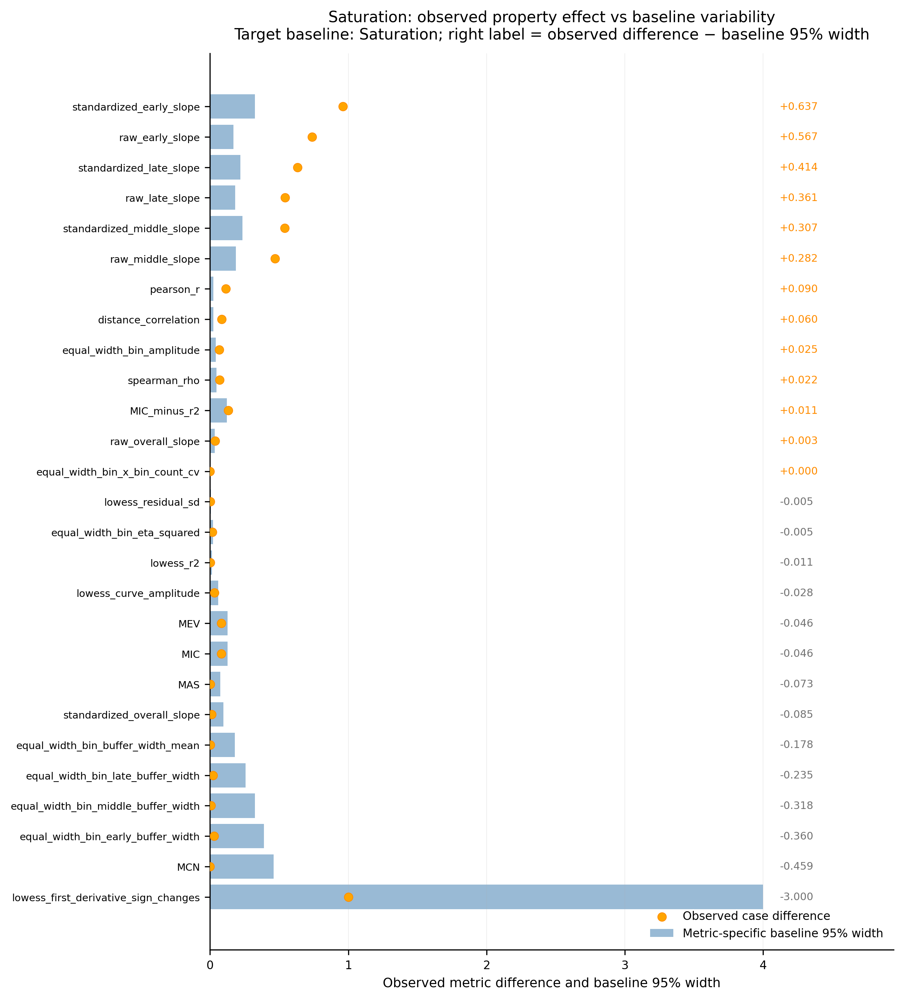

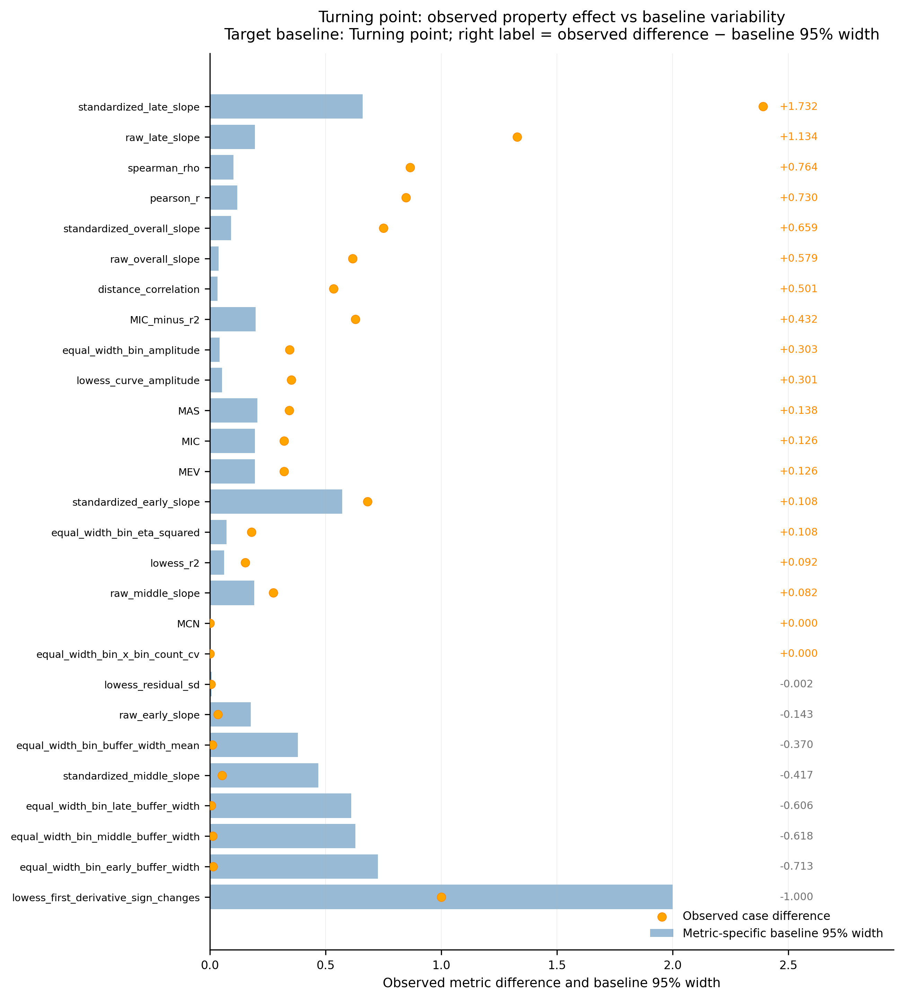

Saved: ./output/observed_vs_baseline_width_plots/Direction_observed_vs_baseline_width.png
Saved: ./output/observed_vs_baseline_width_plots/Monotonicity_observed_vs_baseline_width.png
Saved: ./output/observed_vs_baseline_width_plots/Strength_observed_vs_baseline_width.png
Saved: ./output/observed_vs_baseline_width_plots/Non_linearity_observed_vs_baseline_width.png
Saved: ./output/observed_vs_baseline_width_plots/Convexity_observed_vs_baseline_width.png
Saved: ./output/observed_vs_baseline_width_plots/Concavity_observed_vs_baseline_width.png
Saved: ./output/observed_vs_baseline_width_plots/Saturation_observed_vs_baseline_width.png
Saved: ./output/observed_vs_baseline_width_plots/Turning_point_observed_vs_baseline_width.png
Saved: ./output/observed_vs_baseline_width_plots/Threshold_observed_vs_baseline_width.png
Saved: ./output/observed_vs_baseline_width_plots/Spread_observed_vs_baseline_width.png
Saved: ./output/observed_vs_baseline_width_plots/Heteroscedasticity_observed_vs_baseline_wid

In [13]:
# ==========================================================
# Full property baseline experiment
#
# Orange point:
#   observed_difference from saved no_certainty.xlsx
#
# Blue bar:
#   baseline_95_width from repeated target-case simulations
#
# Main logic:
#   observed_difference = |metric_case_B - metric_case_A|
#   baseline_95_width = q97.5 - q2.5 of repeated target-case metric values
#   observed_minus_baseline95 = observed_difference - baseline_95_width
# ==========================================================

import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import pearsonr, spearmanr
from scipy.spatial.distance import pdist, squareform
from statsmodels.nonparametric.smoothers_lowess import lowess


# ==========================================================
# 0. Basic settings
# ==========================================================

SEED = 88
N = 180
N_RUNS = 1000
BASE_NOISE_SD = 0.035

OUTPUT_DIR = "./output"
os.makedirs(OUTPUT_DIR, exist_ok=True)

OBSERVED_METRIC_FILE = "./output/no_certainty.xlsx"


# ==========================================================
# 1. Optional: MIC / MAS / MEV / MCN
# ==========================================================

try:
    from minepy import MINE
    HAS_MINEPY = True
except Exception:
    HAS_MINEPY = False
    print("minepy is not installed. MIC/MAS/MEV/MCN will be skipped.")


# ==========================================================
# 2. Old metric functions
# These follow your previous compute_all_metrics() logic.
# ==========================================================

# ==========================================================
# Add derived heteroscedasticity-related buffer metrics
# to saved observed metric table
# ==========================================================



def safe_pearson(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 3 or np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return np.nan

    return pearsonr(x, y)[0]


def safe_spearman(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 3 or np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return np.nan

    return spearmanr(x, y)[0]


def distance_correlation(x, y):
    x = np.asarray(x, dtype=float).reshape(-1, 1)
    y = np.asarray(y, dtype=float).reshape(-1, 1)

    valid = np.isfinite(x[:, 0]) & np.isfinite(y[:, 0])
    x = x[valid]
    y = y[valid]

    if len(x) < 3:
        return np.nan

    a = squareform(pdist(x, metric="euclidean"))
    b = squareform(pdist(y, metric="euclidean"))

    A = a - a.mean(axis=0)[None, :] - a.mean(axis=1)[:, None] + a.mean()
    B = b - b.mean(axis=0)[None, :] - b.mean(axis=1)[:, None] + b.mean()

    dcov2_xy = np.mean(A * B)
    dcov2_xx = np.mean(A * A)
    dcov2_yy = np.mean(B * B)

    if dcov2_xx <= 0 or dcov2_yy <= 0:
        return np.nan

    return np.sqrt(dcov2_xy / np.sqrt(dcov2_xx * dcov2_yy))


def compute_mine_metrics(x, y):
    empty = {
        "MIC": np.nan,
        "MAS": np.nan,
        "MEV": np.nan,
        "MCN": np.nan,
        "MIC-r2": np.nan,
    }

    if not HAS_MINEPY:
        return empty

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 5:
        return empty

    mine = MINE(alpha=0.6, c=15)
    mine.compute_score(x, y)

    mic = mine.mic()
    mas = mine.mas()
    mev = mine.mev()
    mcn = mine.mcn()

    r = safe_pearson(x, y)
    r2 = r ** 2 if np.isfinite(r) else np.nan

    return {
        "MIC": mic,
        "MAS": mas,
        "MEV": mev,
        "MCN": mcn,
        "MIC-r2": mic - r2 if np.isfinite(r2) else np.nan,
    }


def minmax01(v):
    v = np.asarray(v, dtype=float)

    v_min = np.nanmin(v)
    v_max = np.nanmax(v)

    if not np.isfinite(v_min) or not np.isfinite(v_max):
        return np.full_like(v, np.nan)

    if v_max == v_min:
        return np.full_like(v, np.nan)

    return (v - v_min) / (v_max - v_min)


def segment_slope_fit(x_seg, y_seg):
    x_seg = np.asarray(x_seg, dtype=float)
    y_seg = np.asarray(y_seg, dtype=float)

    valid = np.isfinite(x_seg) & np.isfinite(y_seg)
    x_seg = x_seg[valid]
    y_seg = y_seg[valid]

    if len(x_seg) < 3 or np.nanstd(x_seg) == 0:
        return np.nan

    return np.polyfit(x_seg, y_seg, 1)[0]


def compute_segment_slopes(x, y, standardized=False):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    if len(x) < 6:
        return np.nan, np.nan, np.nan, np.nan

    order = np.argsort(x)
    x = x[order]
    y = y[order]

    if standardized:
        x = minmax01(x)
        y = minmax01(y)

    n = len(x)
    i1 = n // 3
    i2 = 2 * n // 3

    overall = segment_slope_fit(x, y)
    early = segment_slope_fit(x[:i1], y[:i1])
    middle = segment_slope_fit(x[i1:i2], y[i1:i2])
    late = segment_slope_fit(x[i2:], y[i2:])

    return overall, early, middle, late


def compute_x_bin_count_cv(x, n_bins=10):
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]

    if len(x) == 0:
        return np.nan

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    counts = pd.Series(bins).value_counts().sort_index()
    counts = counts.reindex(np.arange(n_bins), fill_value=0)

    mean_count = counts.mean()
    sd_count = counts.std(ddof=1)

    if mean_count == 0:
        return np.nan

    return sd_count / mean_count


def compute_bin_metrics(x, y, n_bins=10, min_count_per_bin=3):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    empty_result = {
        "amplitude": np.nan,
        "eta squared": np.nan,
        "buffer width mean": np.nan,
        "early buffer width": np.nan,
        "middle buffer width": np.nan,
        "late buffer width": np.nan,
    }

    if len(x) < n_bins:
        return empty_result

    y_sd = np.nanstd(y, ddof=1)

    bins = pd.cut(
        x,
        bins=n_bins,
        labels=False,
        include_lowest=True,
        duplicates="drop",
    )

    df = pd.DataFrame({
        "x": x,
        "y": y,
        "bin": bins,
    }).dropna()

    if df.empty:
        return empty_result

    bin_stats = []

    for bin_id, g in df.groupby("bin", observed=True):

        if len(g) < min_count_per_bin:
            continue

        y_min = g["y"].min()
        y_max = g["y"].max()

        bin_stats.append({
            "bin": bin_id,
            "x_mean": g["x"].mean(),
            "y_mean": g["y"].mean(),
            "y_min": y_min,
            "y_max": y_max,
            "buffer_width": y_max - y_min,
            "count": len(g),
        })

    if len(bin_stats) < 3:
        return empty_result

    bin_df = (
        pd.DataFrame(bin_stats)
        .sort_values("x_mean")
        .reset_index(drop=True)
    )

    amplitude = bin_df["y_mean"].max() - bin_df["y_mean"].min()

    if y_sd == 0 or not np.isfinite(y_sd):
        bin_df["buffer_width_scaled"] = np.nan
    else:
        bin_df["buffer_width_scaled"] = bin_df["buffer_width"] / y_sd

    y_global_mean = df["y"].mean()
    ss_total = np.sum((df["y"] - y_global_mean) ** 2)

    ss_between = 0.0

    for _, g in df.groupby("bin", observed=True):
        if len(g) < min_count_per_bin:
            continue

        y_bin_mean = g["y"].mean()
        ss_between += len(g) * (y_bin_mean - y_global_mean) ** 2

    eta_squared = ss_between / ss_total if ss_total > 0 else np.nan

    n_valid_bins = len(bin_df)
    i1 = n_valid_bins // 3
    i2 = 2 * n_valid_bins // 3

    buffer_mean = bin_df["buffer_width_scaled"].mean()
    buffer_early = bin_df.iloc[:i1]["buffer_width_scaled"].mean()
    buffer_middle = bin_df.iloc[i1:i2]["buffer_width_scaled"].mean()
    buffer_late = bin_df.iloc[i2:]["buffer_width_scaled"].mean()

    return {
        "amplitude": amplitude,
        "eta squared": eta_squared,
        "buffer width mean": buffer_mean,
        "early buffer width": buffer_early,
        "middle buffer width": buffer_middle,
        "late buffer width": buffer_late,
    }


def compute_lowess_metrics(x, y, frac=0.25):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    valid = np.isfinite(x) & np.isfinite(y)
    x = x[valid]
    y = y[valid]

    empty_result = {
        "residual sd": np.nan,
        "curve amplitude": np.nan,
        "r2": np.nan,
        "first derivative sign changes": np.nan,
    }

    if len(x) < 10:
        return empty_result

    order = np.argsort(x)
    x_sorted = x[order]
    y_sorted = y[order]

    fitted = lowess(
        endog=y_sorted,
        exog=x_sorted,
        frac=frac,
        return_sorted=True,
    )

    x_fit = fitted[:, 0]
    y_fit = fitted[:, 1]

    y_pred = np.interp(x_sorted, x_fit, y_fit)

    residual = y_sorted - y_pred
    residual_sd = np.nanstd(residual, ddof=1)

    curve_amplitude = np.nanmax(y_fit) - np.nanmin(y_fit)

    ss_res = np.sum((y_sorted - y_pred) ** 2)
    ss_tot = np.sum((y_sorted - np.nanmean(y_sorted)) ** 2)

    r2 = 1 - ss_res / ss_tot if ss_tot > 0 else np.nan

    dx = np.gradient(x_fit)
    dy = np.gradient(y_fit)

    with np.errstate(divide="ignore", invalid="ignore"):
        derivative = dy / dx

    sign = np.sign(derivative)
    sign[sign == 0] = np.nan

    valid_sign = np.isfinite(sign)

    if valid_sign.sum() < 2:
        sign_changes = np.nan
    else:
        sign_valid = sign[valid_sign]
        sign_changes = np.sum(sign_valid[1:] != sign_valid[:-1])

    return {
        "residual sd": residual_sd,
        "curve amplitude": curve_amplitude,
        "r2": r2,
        "first derivative sign changes": sign_changes,
    }


def compute_all_metrics(x, y):
    metrics = {}

    metrics["pearson r"] = safe_pearson(x, y)
    metrics["spearman rho"] = safe_spearman(x, y)
    metrics["distance correlation"] = distance_correlation(x, y)

    (
        metrics["raw overall slope"],
        metrics["raw early slope"],
        metrics["raw middle slope"],
        metrics["raw late slope"],
    ) = compute_segment_slopes(x, y, standardized=False)

    (
        metrics["standardized overall slope"],
        metrics["standardized early slope"],
        metrics["standardized middle slope"],
        metrics["standardized late slope"],
    ) = compute_segment_slopes(x, y, standardized=True)

    metrics.update(compute_mine_metrics(x, y))
    metrics.update(compute_bin_metrics(x, y))

    metrics["x bin count coefficient of variation"] = compute_x_bin_count_cv(x)

    metrics.update(compute_lowess_metrics(x, y))

    return metrics


# ==========================================================
# 3. Rename old metric names to no_certainty.xlsx metric names
# ==========================================================

OLD_TO_SAVED_METRIC_NAME = {
    "pearson r": "pearson_r",
    "spearman rho": "spearman_rho",
    "distance correlation": "distance_correlation",

    "raw overall slope": "raw_overall_slope",
    "raw early slope": "raw_early_slope",
    "raw middle slope": "raw_middle_slope",
    "raw late slope": "raw_late_slope",

    "standardized overall slope": "standardized_overall_slope",
    "standardized early slope": "standardized_early_slope",
    "standardized middle slope": "standardized_middle_slope",
    "standardized late slope": "standardized_late_slope",

    "MIC": "MIC",
    "MAS": "MAS",
    "MEV": "MEV",
    "MCN": "MCN",
    "MIC-r2": "MIC_minus_r2",

    "amplitude": "equal_width_bin_amplitude",
    "eta squared": "equal_width_bin_eta_squared",
    "buffer width mean": "equal_width_bin_buffer_width_mean",
    "early buffer width": "equal_width_bin_early_buffer_width",
    "middle buffer width": "equal_width_bin_middle_buffer_width",
    "late buffer width": "equal_width_bin_late_buffer_width",

    "x bin count coefficient of variation": "equal_width_bin_x_bin_count_cv",

    "residual sd": "lowess_residual_sd",
    "curve amplitude": "lowess_curve_amplitude",
    "r2": "lowess_r2",
    "first derivative sign changes": "lowess_first_derivative_sign_changes",
}


def compute_metrics_wrapper(x, y):
    """
    Use old compute_all_metrics(), then rename columns to match no_certainty.xlsx.
    """

    old_metrics = compute_all_metrics(x, y)

    renamed_metrics = {}

    for old_name, value in old_metrics.items():
        new_name = OLD_TO_SAVED_METRIC_NAME.get(old_name)

        if new_name is not None:
            renamed_metrics[new_name] = value

    return renamed_metrics


# ==========================================================
# 4. Load saved original metric table
# Orange points are calculated from this table.
# ==========================================================

observed_metric_source_df = pd.read_excel(
    OBSERVED_METRIC_FILE,
    sheet_name="metrics_no_certainty",
)

id_cols_saved = ["property", "case", "side"]

available_metric_cols = [
    c for c in OLD_TO_SAVED_METRIC_NAME.values()
    if c in observed_metric_source_df.columns
]

observed_metric_source_df = observed_metric_source_df[
    id_cols_saved + available_metric_cols
].copy()

print("Loaded observed metric table:")
print(observed_metric_source_df.shape)
display(observed_metric_source_df.head())


# ==========================================================
# 5. Property list and configs
# ==========================================================

properties_to_run = [
    "Direction",
    "Monotonicity",
    "Strength",
    "Non-linearity",
    "Convexity",
    "Concavity",
    "Saturation",
    "Turning point",
    "Threshold",
    "Spread",
    "Heteroscedasticity",
    "Density",
    "Clustering",
]


baseline_config = {
    "Direction": {
        "baseline_source_prop": "Direction",
        "baseline_side": 1,
    },
    "Monotonicity": {
        "baseline_source_prop": "Monotonicity",
        "baseline_side": 0,
    },
    "Strength": {
        "baseline_source_prop": "Strength",
        "baseline_side": 0,
    },
    "Non-linearity": {
        "baseline_source_prop": "Non-linearity",
        "baseline_side": 0,
    },
    "Convexity": {
        "baseline_source_prop": "Convexity / Concavity",
        "baseline_side": 0,
    },
    "Concavity": {
        "baseline_source_prop": "Convexity / Concavity",
        "baseline_side": 1,
    },
    "Saturation": {
        "baseline_source_prop": "Saturation",
        "baseline_side": 1,
    },
    "Turning point": {
        "baseline_source_prop": "Turning point",
        "baseline_side": 1,
    },
    "Threshold": {
        "baseline_source_prop": "Threshold",
        "baseline_side": 1,
    },
    "Spread": {
        "baseline_source_prop": "Spread",
        "baseline_side": 1,
    },
    "Heteroscedasticity": {
        "baseline_source_prop": "Heteroscedasticity",
        "baseline_side": 1,
    },
    "Density": {
        "baseline_source_prop": "Density",
        "baseline_side": 1,
    },
    "Clustering": {
        "baseline_source_prop": "Clustering",
        "baseline_side": 1,
    },
}


observed_metric_pair_config = {
    "Direction": {
        "case_a": ("Direction", "Positive direction"),
        "case_b": ("Direction", "Negative direction"),
    },
    "Monotonicity": {
        "case_a": ("Monotonicity", "Monotonic"),
        "case_b": ("Monotonicity", "Non-monotonic"),
    },
    "Strength": {
        "case_a": ("Strength", "Weak response"),
        "case_b": ("Strength", "Strong response"),
    },
    "Non-linearity": {
        "case_a": ("Non-linearity", "Linear"),
        "case_b": ("Non-linearity", "Non-linear"),
    },
    "Convexity": {
        "case_a": ("Direction", "Positive direction"),
        "case_b": ("Convexity / Concavity", "Convex"),
    },
    "Concavity": {
        "case_a": ("Direction", "Positive direction"),
        "case_b": ("Convexity / Concavity", "Concave"),
    },
    "Saturation": {
        "case_a": ("Saturation", "No saturation"),
        "case_b": ("Saturation", "Saturation"),
    },
    "Turning point": {
        "case_a": ("Turning point", "No turning point"),
        "case_b": ("Turning point", "Turning point"),
    },
    "Threshold": {
        "case_a": ("Threshold", "No threshold"),
        "case_b": ("Threshold", "Threshold-like change"),
    },
    "Spread": {
        "case_a": ("Spread", "Low spread"),
        "case_b": ("Spread", "High spread"),
    },
    "Heteroscedasticity": {
        "case_a": ("Heteroscedasticity", "Constant spread"),
        "case_b": ("Heteroscedasticity", "Changing spread"),
    },
    "Density": {
        "case_a": ("Density", "Even coverage"),
        "case_b": ("Density", "Uneven coverage"),
    },
    "Clustering": {
        "case_a": ("Clustering", "Single cloud"),
        "case_b": ("Clustering", "Separated clusters"),
    },
}


# ==========================================================
# 6. Deterministic synthetic property generator
# Used only for baseline repeated simulations.
# ==========================================================

def generate_property_pair_original(
    property_name,
    n=180,
    seed=88,
):
    rng = np.random.default_rng(seed)
    x = np.linspace(0, 1, n)

    if property_name == "Direction":
        y_a = 0.18 + 0.68 * x
        y_b = 0.86 - 0.68 * x
        return x, y_a, x, y_b, "Positive direction", "Negative direction"

    elif property_name == "Monotonicity":
        y_a = 0.18 + 0.68 * x
        y_b = 0.18 + 1.15 * (x - 0.50) ** 2
        return x, y_a, x, y_b, "Monotonic", "Non-monotonic"

    elif property_name == "Strength":
        y_a = 0.30 + 0.32 * x
        y_b = 0.14 + 0.70 * x
        return x, y_a, x, y_b, "Weak response", "Strong response"

    elif property_name == "Non-linearity":
        y_a = 0.15 + 0.72 * x
        y_b = 0.08 + 0.84 / (1 + np.exp(-11.0 * (x - 0.50)))
        return x, y_a, x, y_b, "Linear", "Non-linear"

    elif property_name == "Convexity / Concavity":
        y_a = 0.08 + 0.86 * (x ** 2.8)
        y_b = 0.08 + 0.86 * (1 - (1 - x) ** 2.8)
        return x, y_a, x, y_b, "Convex", "Concave"

    elif property_name == "Saturation":
        y_a = 0.14 + 0.76 * x
        y_b = 0.14 + 0.76 * (1 - np.exp(-4.5 * x))
        return x, y_a, x, y_b, "No saturation", "Saturation"

    elif property_name == "Turning point":
        y_a = 0.18 + 0.68 * x
        y_b = 0.78 - 1.10 * (x - 0.52) ** 2
        return x, y_a, x, y_b, "No turning point", "Turning point"

    elif property_name == "Threshold":
        y_a = 0.18 + 0.68 * x
        threshold = 0.58
        y_b = 0.25 + 0.53 / (1 + np.exp(-45 * (x - threshold)))
        return x, y_a, x, y_b, "No threshold", "Threshold-like change"

    elif property_name == "Spread":
        y_a = 0.18 + 0.68 * x
        y_b = 0.18 + 0.68 * x
        return x, y_a, x, y_b, "Low spread", "High spread"

    elif property_name == "Heteroscedasticity":
        y_a = 0.18 + 0.68 * x
        y_b = 0.18 + 0.68 * x
        return x, y_a, x, y_b, "Constant spread", "Changing spread"

    elif property_name == "Density":
        x_a = np.linspace(0.02, 0.98, n)
        y_a = 0.18 + 0.68 * x_a

        n1 = 110
        n2 = n - n1

        x_b = np.concatenate([
            rng.uniform(0.02, 0.34, n1),
            rng.uniform(0.34, 0.98, n2),
        ])
        x_b = np.sort(x_b)
        y_b = 0.18 + 0.68 * x_b

        return x_a, y_a, x_b, y_b, "Even coverage", "Uneven coverage"

    elif property_name == "Clustering":
        x_a = rng.uniform(0.02, 0.98, n)
        y_a = 0.18 + 0.68 * x_a

        n1, n2, n3 = 55, 60, n - 115

        x_c1 = rng.normal(0.22, 0.045, n1)
        y_c1 = rng.normal(0.30, 0.045, n1)

        x_c2 = rng.normal(0.52, 0.050, n2)
        y_c2 = rng.normal(0.60, 0.050, n2)

        x_c3 = rng.normal(0.80, 0.045, n3)
        y_c3 = rng.normal(0.40, 0.045, n3)

        x_b = np.concatenate([x_c1, x_c2, x_c3])
        y_b = np.concatenate([y_c1, y_c2, y_c3])

        x_b = np.clip(x_b, 0.02, 0.98)
        y_b = np.clip(y_b, 0.05, 0.95)

        return x_a, y_a, x_b, y_b, "Single cloud", "Separated clusters"

    else:
        raise ValueError(f"Unknown property_name: {property_name}")


# ==========================================================
# 7. Noise logic
#
# Clean theoretical logic:
#   - Most shape properties use common small noise.
#   - Spread uses larger noise for high spread.
#   - Heteroscedasticity uses x-dependent noise.
#   - Density uses changed x distribution.
#   - Clustering uses clustered x-y structure.
# ==========================================================

def add_noise_to_case(
    property_name,
    x,
    y_base,
    side,
    seed,
    base_noise_sd=0.035,
):
    rng = np.random.default_rng(seed)

    x = np.asarray(x, dtype=float)
    y_base = np.asarray(y_base, dtype=float)

    if property_name == "Spread":
        noise_sd = 0.035 if side == 0 else 0.17
        y = y_base + rng.normal(0, noise_sd, len(y_base))

    elif property_name == "Heteroscedasticity":
        if side == 0:
            noise_sd = np.full_like(x, 0.075)
        else:
            noise_sd = 0.025 + 0.18 * x

        y = y_base + rng.normal(0, noise_sd, len(y_base))

    elif property_name == "Clustering":
        noise_sd = 0.035
        y = y_base + rng.normal(0, noise_sd, len(y_base))

    else:
        y = y_base + rng.normal(0, base_noise_sd, len(y_base))

    y = np.clip(y, 0, 1)

    return x, y


def generate_noisy_case(
    source_property_name,
    side,
    seed,
    n=180,
    base_noise_sd=0.035,
):
    x_a, y_a, x_b, y_b, case_a_name, case_b_name = generate_property_pair_original(
        property_name=source_property_name,
        n=n,
        seed=seed,
    )

    if side == 0:
        x, y_base = x_a, y_a
        case_name = case_a_name
    else:
        x, y_base = x_b, y_b
        case_name = case_b_name

    x_noisy, y_noisy = add_noise_to_case(
        property_name=source_property_name,
        x=x,
        y_base=y_base,
        side=side,
        seed=seed + 999,
        base_noise_sd=base_noise_sd,
    )

    return x_noisy, y_noisy, case_name


# ==========================================================
# 8. Observed difference from no_certainty.xlsx
# ==========================================================

def get_saved_metric_row(
    df,
    property_name,
    case_name,
):
    row = df[
        (df["property"] == property_name)
        & (df["case"] == case_name)
    ].copy()

    if row.empty:
        raise ValueError(
            f"Cannot find row: property={property_name}, case={case_name}"
        )

    if len(row) > 1:
        print(
            f"Warning: multiple rows found for property={property_name}, "
            f"case={case_name}. Using the first one."
        )

    return row.iloc[0]


def compute_observed_difference_from_saved_metrics(
    target_property,
    observed_metric_source_df,
):
    cfg = observed_metric_pair_config[target_property]

    prop_a, case_a_name = cfg["case_a"]
    prop_b, case_b_name = cfg["case_b"]

    row_a = get_saved_metric_row(
        observed_metric_source_df,
        property_name=prop_a,
        case_name=case_a_name,
    )

    row_b = get_saved_metric_row(
        observed_metric_source_df,
        property_name=prop_b,
        case_name=case_b_name,
    )

    id_cols = ["property", "case", "side"]

    metric_cols = [
        c for c in observed_metric_source_df.columns
        if c not in id_cols
    ]

    records = []

    for metric in metric_cols:

        value_a = row_a[metric]
        value_b = row_b[metric]

        if not np.isfinite(value_a) or not np.isfinite(value_b):
            continue

        records.append({
            "property": target_property,
            "case_a_source_property": prop_a,
            "case_b_source_property": prop_b,
            "case_a": case_a_name,
            "case_b": case_b_name,
            "metric": metric,
            "case_a_value": value_a,
            "case_b_value": value_b,
            "observed_difference": abs(value_b - value_a),
        })

    return pd.DataFrame(records)


# ==========================================================
# 9. Baseline repeated simulations
# ==========================================================

def run_baseline_repeats(
    target_property,
    n_runs=1000,
    n=180,
    base_noise_sd=0.035,
    base_seed=10000,
):
    cfg = baseline_config[target_property]

    source_property = cfg["baseline_source_prop"]
    baseline_side = cfg["baseline_side"]

    records = []

    for i in range(n_runs):

        seed_i = base_seed + i

        x_i, y_i, case_name_i = generate_noisy_case(
            source_property_name=source_property,
            side=baseline_side,
            seed=seed_i,
            n=n,
            base_noise_sd=base_noise_sd,
        )

        metrics_i = compute_metrics_wrapper(x_i, y_i)

        metrics_i["property"] = target_property
        metrics_i["baseline_source_property"] = source_property
        metrics_i["baseline_case"] = case_name_i
        metrics_i["baseline_side"] = baseline_side
        metrics_i["run"] = i
        metrics_i["seed"] = seed_i

        records.append(metrics_i)

    baseline_df = pd.DataFrame(records)

    id_cols = [
        "property",
        "baseline_source_property",
        "baseline_case",
        "baseline_side",
        "run",
        "seed",
    ]

    metric_cols = [c for c in baseline_df.columns if c not in id_cols]

    baseline_df = baseline_df[id_cols + metric_cols]

    return baseline_df


def summarize_baseline_values(baseline_df):
    id_cols = [
        "property",
        "baseline_source_property",
        "baseline_case",
        "baseline_side",
        "run",
        "seed",
    ]

    metric_cols = [c for c in baseline_df.columns if c not in id_cols]

    records = []

    property_name = baseline_df["property"].iloc[0]
    baseline_source_property = baseline_df["baseline_source_property"].iloc[0]
    baseline_case = baseline_df["baseline_case"].iloc[0]
    baseline_side = baseline_df["baseline_side"].iloc[0]

    for metric in metric_cols:

        values = (
            baseline_df[metric]
            .replace([np.inf, -np.inf], np.nan)
            .dropna()
        )

        if len(values) == 0:
            continue

        q025 = values.quantile(0.025)
        q975 = values.quantile(0.975)

        records.append({
            "property": property_name,
            "baseline_source_property": baseline_source_property,
            "baseline_case": baseline_case,
            "baseline_side": baseline_side,
            "metric": metric,
            "baseline_mean": values.mean(),
            "baseline_sd": values.std(ddof=1),
            "baseline_min": values.min(),
            "baseline_max": values.max(),
            "baseline_q025": q025,
            "baseline_q975": q975,
            "baseline_95_width": q975 - q025,
            "baseline_range": values.max() - values.min(),
            "baseline_n_valid": len(values),
        })

    return pd.DataFrame(records)


# ==========================================================
# 10. Run one property
# ==========================================================

def run_one_property_experiment(
    target_property,
    observed_metric_source_df,
    n_runs=1000,
    n=180,
    base_noise_sd=0.035,
    base_seed=10000,
):
    observed_df = compute_observed_difference_from_saved_metrics(
        target_property=target_property,
        observed_metric_source_df=observed_metric_source_df,
    )

    baseline_df = run_baseline_repeats(
        target_property=target_property,
        n_runs=n_runs,
        n=n,
        base_noise_sd=base_noise_sd,
        base_seed=base_seed,
    )

    baseline_summary_df = summarize_baseline_values(
        baseline_df=baseline_df,
    )

    comparison_df = observed_df.merge(
        baseline_summary_df,
        on=["property", "metric"],
        how="left",
    )

    comparison_df["ratio_to_baseline_95_width"] = (
        comparison_df["observed_difference"]
        / comparison_df["baseline_95_width"]
    )

    comparison_df["ratio_to_baseline_sd"] = (
        comparison_df["observed_difference"]
        / comparison_df["baseline_sd"]
    )

    comparison_df["larger_than_baseline_95_width"] = (
        comparison_df["observed_difference"]
        > comparison_df["baseline_95_width"]
    )

    comparison_df["larger_than_baseline_range"] = (
        comparison_df["observed_difference"]
        > comparison_df["baseline_range"]
    )

    comparison_df["observed_minus_baseline95"] = (
        comparison_df["observed_difference"]
        - comparison_df["baseline_95_width"]
    )

    comparison_df = comparison_df.replace([np.inf, -np.inf], np.nan)

    comparison_df = comparison_df.sort_values(
        "observed_minus_baseline95",
        ascending=False,
    ).reset_index(drop=True)

    return {
        "property": target_property,
        "observed_df": observed_df,
        "baseline_df": baseline_df,
        "baseline_summary_df": baseline_summary_df,
        "comparison_df": comparison_df,
    }


# ==========================================================
# 11. Run all properties
# ==========================================================

all_property_results = {}
all_observed_records = []
all_baseline_summary_records = []
all_comparison_records = []

for idx, target_property in enumerate(properties_to_run):

    print(f"Running property: {target_property}")

    result = run_one_property_experiment(
        target_property=target_property,
        observed_metric_source_df=observed_metric_source_df,
        n_runs=N_RUNS,
        n=N,
        base_noise_sd=BASE_NOISE_SD,
        base_seed=10000 + idx * 100000,
    )

    all_property_results[target_property] = result

    all_observed_records.append(result["observed_df"])
    all_baseline_summary_records.append(result["baseline_summary_df"])
    all_comparison_records.append(result["comparison_df"])

all_observed_df = pd.concat(
    all_observed_records,
    ignore_index=True,
)

all_baseline_summary_df = pd.concat(
    all_baseline_summary_records,
    ignore_index=True,
)

all_comparison_df = pd.concat(
    all_comparison_records,
    ignore_index=True,
)

print("Finished all properties.")
print(list(all_property_results.keys()))

display(all_comparison_df.head(20))


# ==========================================================
# 12. Save results
# ==========================================================

output_excel = os.path.join(
    OUTPUT_DIR,
    "all_property_baseline_comparison_from_no_certainty.xlsx",
)

with pd.ExcelWriter(output_excel, engine="openpyxl") as writer:

    all_observed_df.round(4).to_excel(
        writer,
        sheet_name="observed_difference",
        index=False,
    )

    all_baseline_summary_df.round(4).to_excel(
        writer,
        sheet_name="baseline_summary",
        index=False,
    )

    all_comparison_df.round(4).to_excel(
        writer,
        sheet_name="comparison_all",
        index=False,
    )

print(f"Saved Excel: {output_excel}")


# ==========================================================
# 13. Save ratio > 1 results
# ==========================================================

ratio_gt_1_df = all_comparison_df[
    all_comparison_df["ratio_to_baseline_95_width"] > 1
].copy()

ratio_gt_1_df = ratio_gt_1_df.sort_values(
    ["property", "ratio_to_baseline_95_width"],
    ascending=[True, False],
).reset_index(drop=True)

output_ratio_csv = os.path.join(
    OUTPUT_DIR,
    "metrics_ratio_gt_1_all_properties_from_no_certainty.csv",
)

ratio_gt_1_df.round(4).to_csv(
    output_ratio_csv,
    index=False,
    encoding="utf-8-sig",
)

print(f"Saved ratio > 1 CSV: {output_ratio_csv}")

display(ratio_gt_1_df.head(30))


# ==========================================================
# 14. Plot one property
#
# Blue bar:
#   metric-specific baseline 95% width
#
# Orange point:
#   observed difference from no_certainty.xlsx
#
# Text:
#   observed_difference - baseline_95_width
# ==========================================================

def plot_observed_vs_baseline_width(
    target_property,
    all_property_results,
    sort_by="observed_minus_baseline95",
    ascending=True,
    top_k=None,
    save=False,
    output_dir="./output/observed_vs_baseline_width_plots",
):
    if target_property not in all_property_results:
        print(f"{target_property} not found.")
        print("Available properties:")
        print(list(all_property_results.keys()))
        return

    comparison_df = all_property_results[target_property]["comparison_df"].copy()

    plot_df = comparison_df.replace([np.inf, -np.inf], np.nan)

    plot_df = plot_df.dropna(
        subset=[
            "baseline_95_width",
            "observed_difference",
            "observed_minus_baseline95",
        ]
    )

    if plot_df.empty:
        print(f"No valid data to plot for {target_property}.")
        return

    if sort_by in plot_df.columns:
        plot_df = plot_df.sort_values(
            sort_by,
            ascending=ascending,
        ).reset_index(drop=True)

    if top_k is not None:
        if ascending:
            plot_df = plot_df.tail(top_k).reset_index(drop=True)
        else:
            plot_df = plot_df.head(top_k).reset_index(drop=True)

    fig, ax = plt.subplots(
        figsize=(8.8, max(6, 0.36 * len(plot_df))),
        dpi=300,
    )

    y_pos = np.arange(len(plot_df))

    ax.barh(
        y_pos,
        plot_df["baseline_95_width"],
        alpha=0.55,
        color="steelblue",
        label="Metric-specific baseline 95% width",
    )

    ax.scatter(
        plot_df["observed_difference"],
        y_pos,
        s=35,
        color="orange",
        edgecolor="darkorange",
        linewidth=0.5,
        zorder=3,
        label="Observed case difference",
    )

    x_text = max(
        plot_df["observed_difference"].max(),
        plot_df["baseline_95_width"].max(),
    ) * 1.03

    for i, row in plot_df.iterrows():

        gap = row["observed_minus_baseline95"]

        if gap >= 0:
            label = f"+{gap:.3f}"
            color = "darkorange"
        else:
            label = f"{gap:.3f}"
            color = "0.45"

        ax.text(
            x_text,
            i,
            label,
            va="center",
            ha="left",
            fontsize=7.2,
            color=color,
        )

    ax.set_yticks(y_pos)
    ax.set_yticklabels(
        plot_df["metric"],
        fontsize=7,
    )

    ax.set_xlabel(
        "Observed metric difference and baseline 95% width",
        fontsize=9,
    )

    baseline_info = ""
    if "baseline_case" in plot_df.columns and len(plot_df) > 0:
        baseline_case = plot_df["baseline_case"].iloc[0]
        baseline_info = f"Target baseline: {baseline_case}; "

    ax.set_title(
        f"{target_property}: observed property effect vs baseline variability\n"
        f"{baseline_info}right label = observed difference − baseline 95% width",
        fontsize=10.5,
        pad=10,
    )

    ax.legend(
        frameon=False,
        fontsize=8,
        loc="lower right",
    )

    ax.tick_params(axis="x", labelsize=8)

    ax.grid(
        axis="x",
        linewidth=0.4,
        alpha=0.25,
    )

    for spine in ["top", "right"]:
        ax.spines[spine].set_visible(False)

    ax.set_xlim(
        left=0,
        right=x_text * 1.20,
    )

    plt.tight_layout()

    if save:
        os.makedirs(output_dir, exist_ok=True)

        safe_name = (
            target_property
            .replace("/", "_")
            .replace(" ", "_")
            .replace("-", "_")
        )

        output_path = os.path.join(
            output_dir,
            f"{safe_name}_observed_vs_baseline_width.png",
        )

        plt.savefig(output_path, dpi=300, bbox_inches="tight")
        plt.close()

        print(f"Saved: {output_path}")

    else:
        plt.show()


# ==========================================================
# 15. Example plots
# ==========================================================

plot_observed_vs_baseline_width(
    target_property="Saturation",
    all_property_results=all_property_results,
    sort_by="observed_minus_baseline95",
    ascending=True,
    top_k=None,
    save=False,
)

plot_observed_vs_baseline_width(
    target_property="Turning point",
    all_property_results=all_property_results,
    sort_by="observed_minus_baseline95",
    ascending=True,
    top_k=None,
    save=False,
)


# ==========================================================
# 16. Save plots for all properties
# ==========================================================

for target_property in properties_to_run:
    plot_observed_vs_baseline_width(
        target_property=target_property,
        all_property_results=all_property_results,
        sort_by="observed_minus_baseline95",
        ascending=True,
        top_k=None,
        save=True,
        output_dir="./output/observed_vs_baseline_width_plots",
    )

Plotting raw figure: Direction
Saved raw figure: ./property_baseline_outputs/figures/Direction_raw_observed_vs_baseline95.png


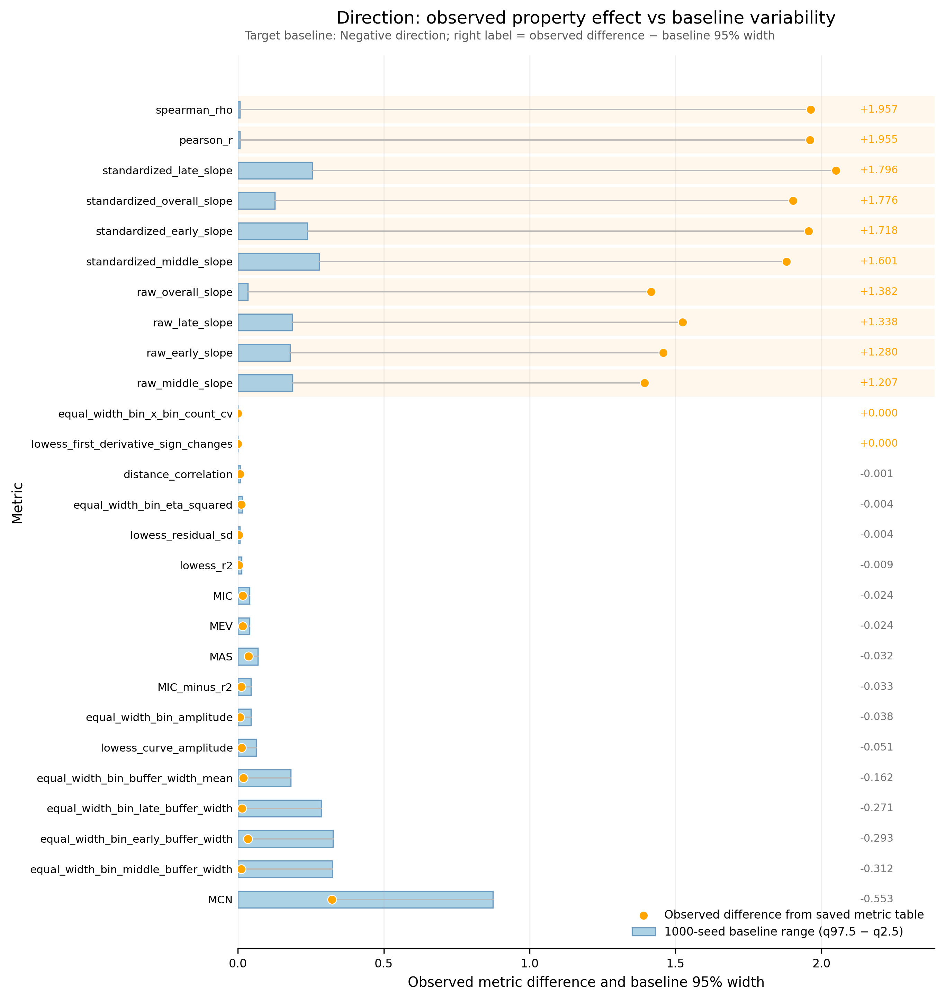

Plotting normalized figure: Direction
Saved normalized figure: ./property_baseline_outputs/figures/Direction_normalized_observed_vs_baseline95.png


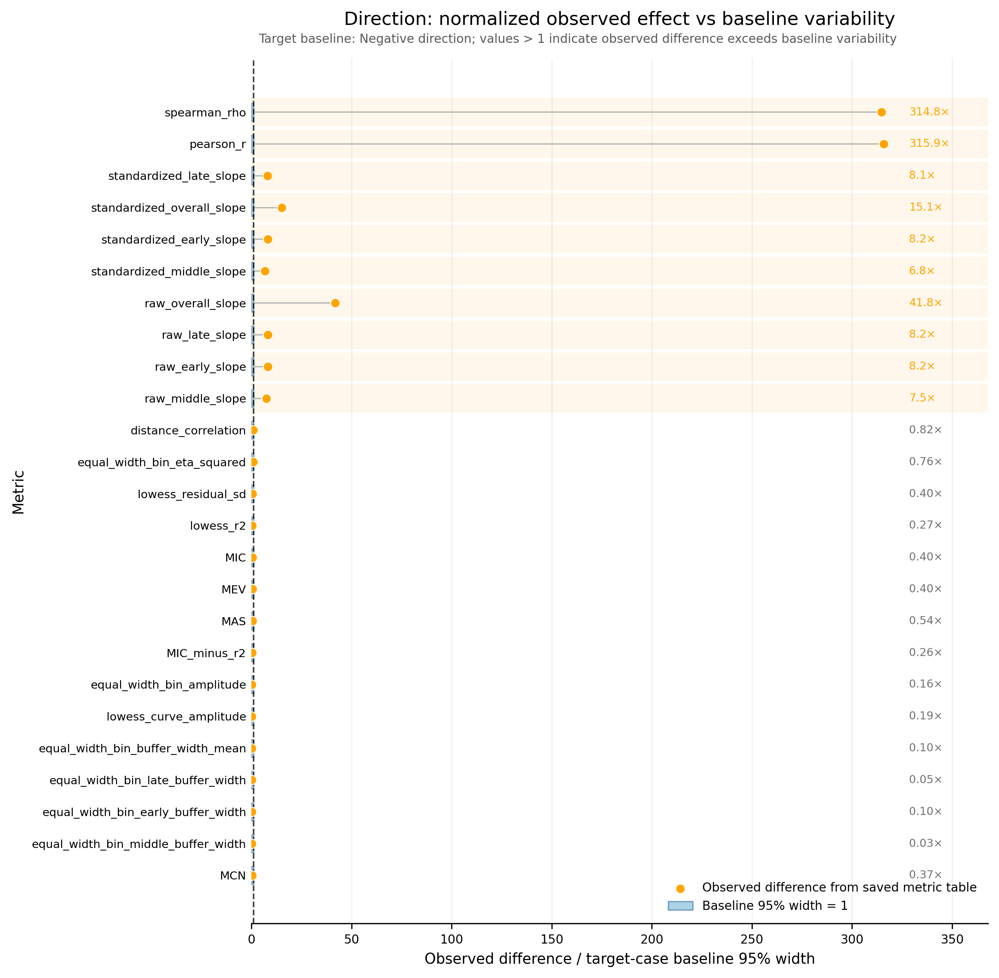

Plotting raw figure: Monotonicity
Saved raw figure: ./property_baseline_outputs/figures/Monotonicity_raw_observed_vs_baseline95.png


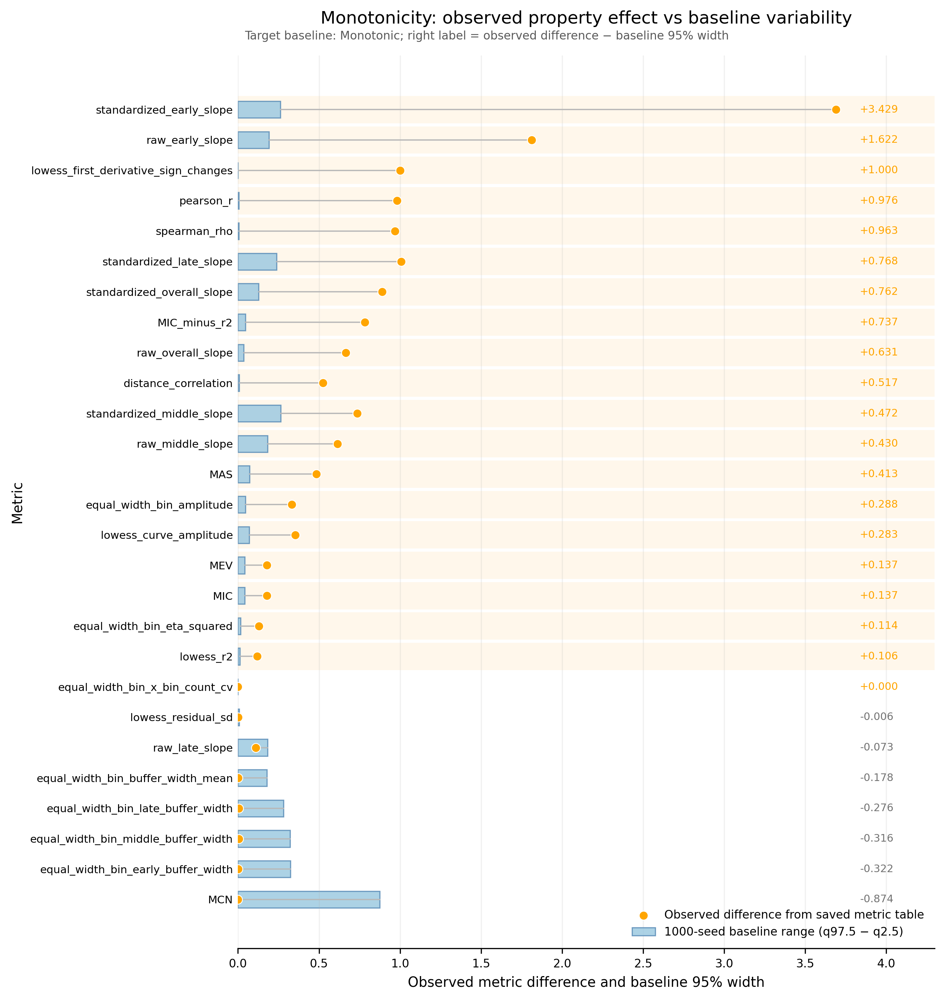

Plotting normalized figure: Monotonicity
Saved normalized figure: ./property_baseline_outputs/figures/Monotonicity_normalized_observed_vs_baseline95.png


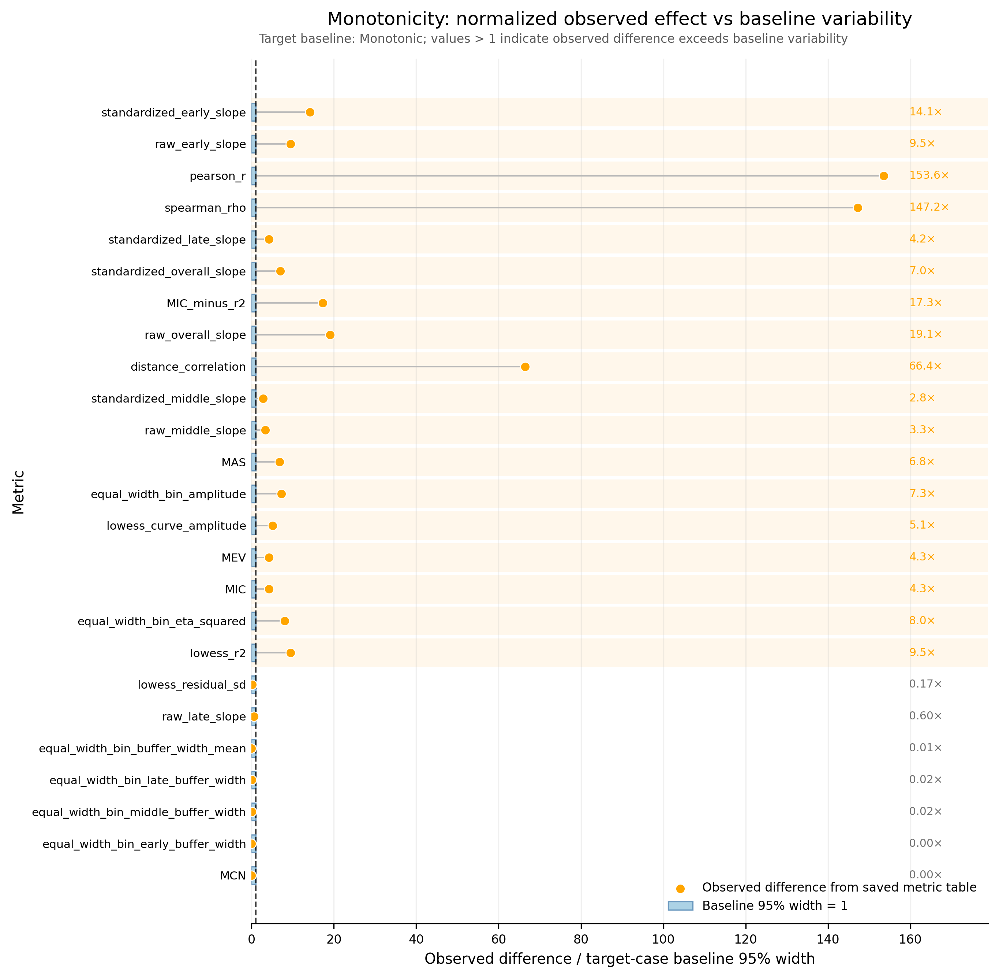

Plotting raw figure: Strength
Saved raw figure: ./property_baseline_outputs/figures/Strength_raw_observed_vs_baseline95.png


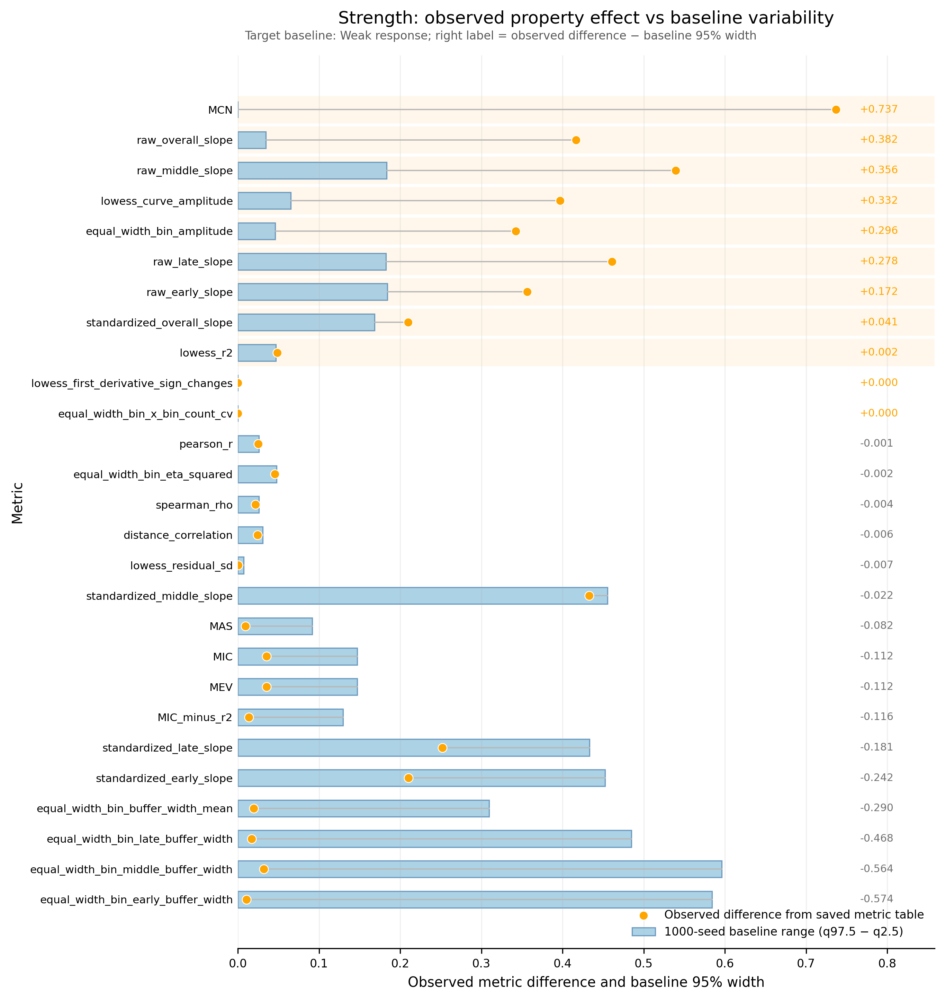

Plotting normalized figure: Strength
Saved normalized figure: ./property_baseline_outputs/figures/Strength_normalized_observed_vs_baseline95.png


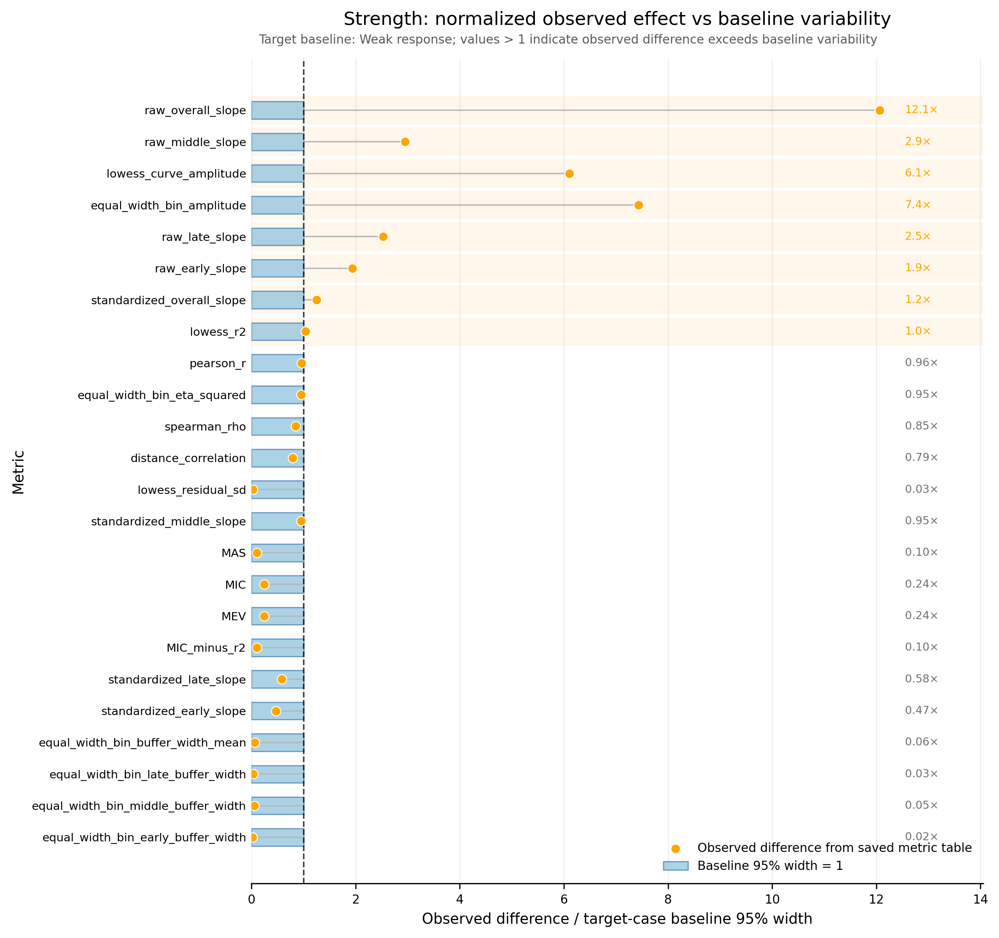

Plotting raw figure: Non-linearity
Saved raw figure: ./property_baseline_outputs/figures/Non_linearity_raw_observed_vs_baseline95.png


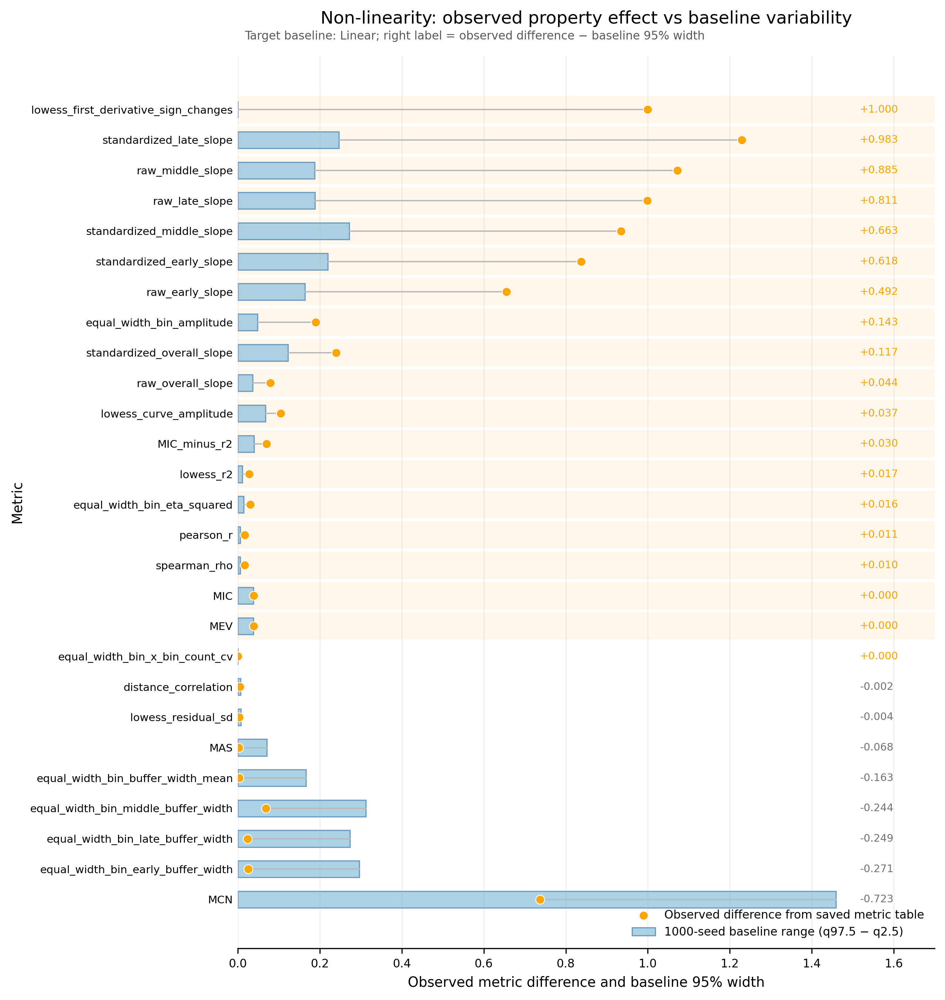

Plotting normalized figure: Non-linearity
Saved normalized figure: ./property_baseline_outputs/figures/Non_linearity_normalized_observed_vs_baseline95.png


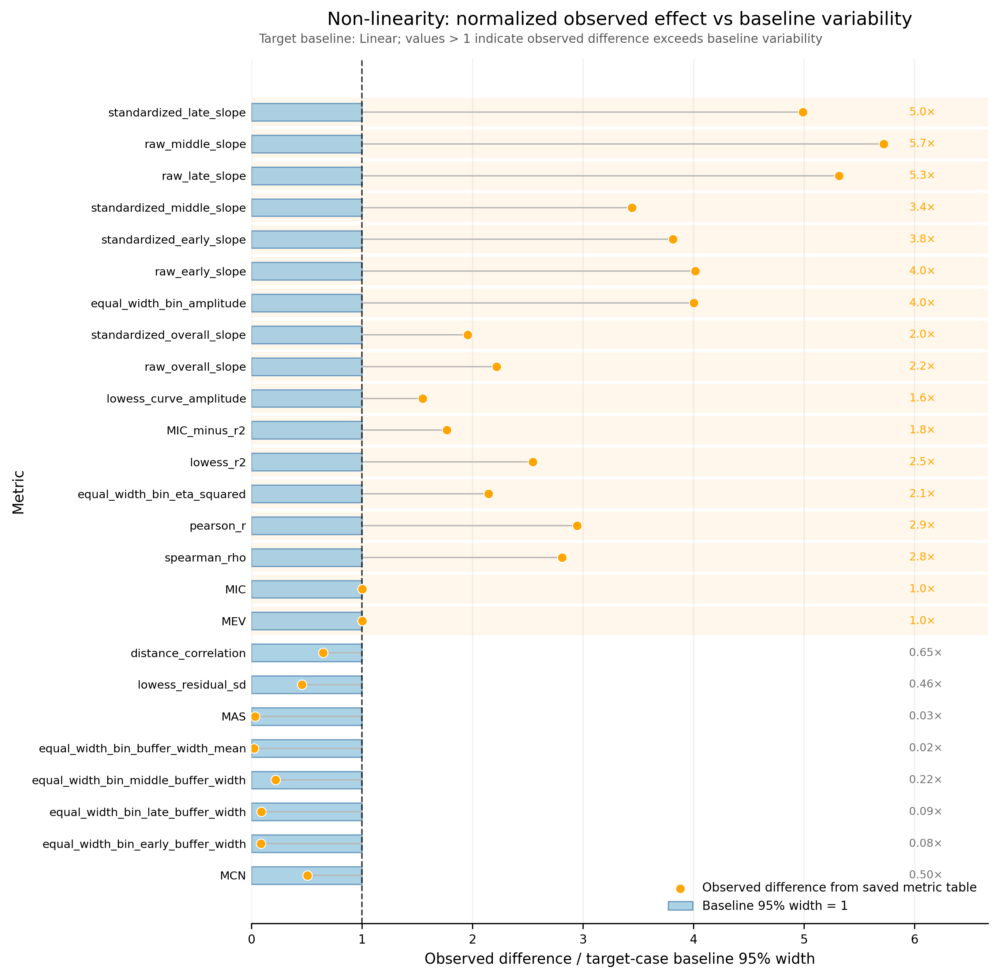

Plotting raw figure: Convexity
Saved raw figure: ./property_baseline_outputs/figures/Convexity_raw_observed_vs_baseline95.png


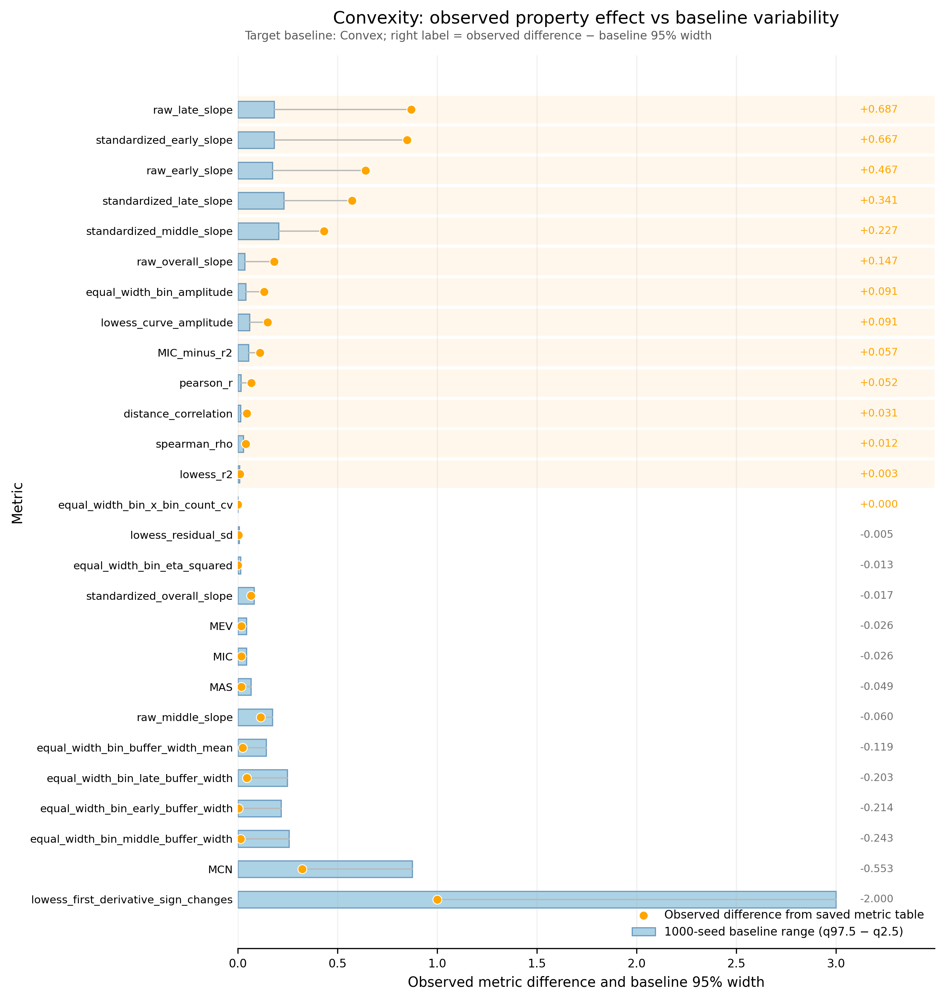

Plotting normalized figure: Convexity
Saved normalized figure: ./property_baseline_outputs/figures/Convexity_normalized_observed_vs_baseline95.png


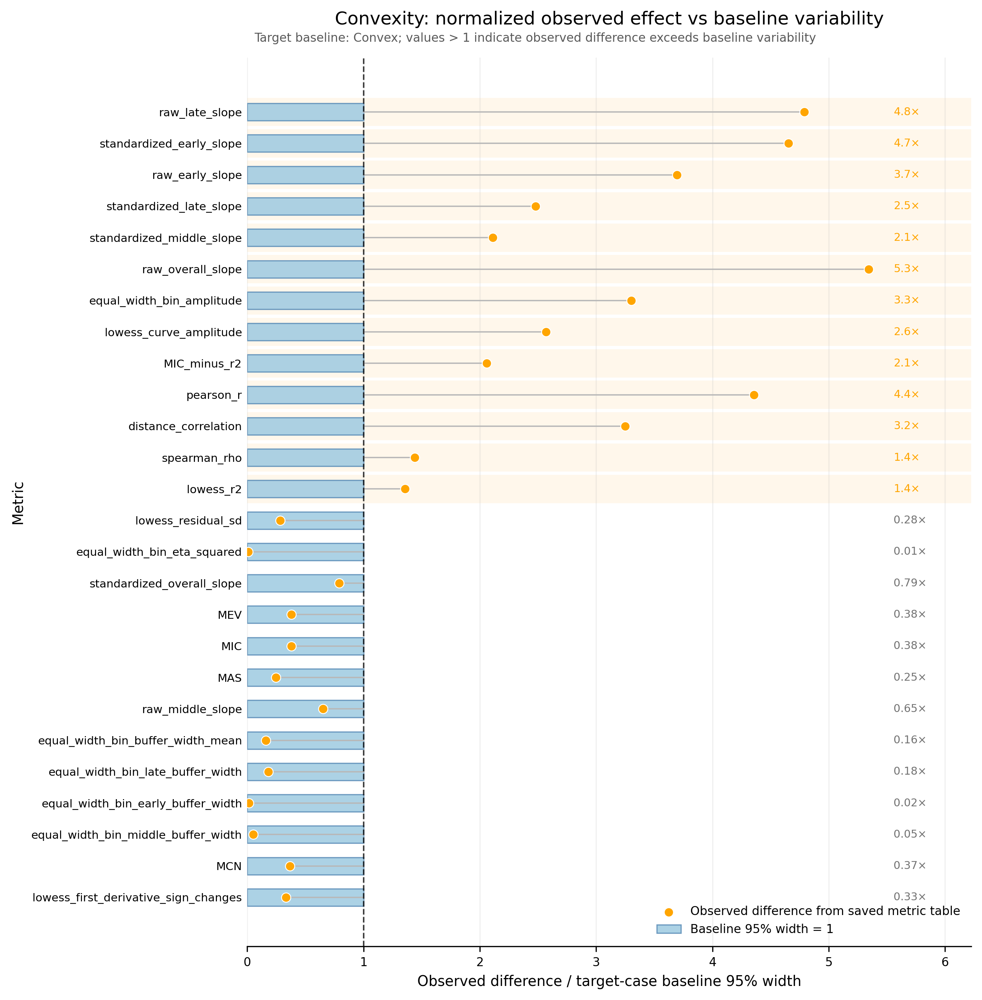

Plotting raw figure: Concavity
Saved raw figure: ./property_baseline_outputs/figures/Concavity_raw_observed_vs_baseline95.png


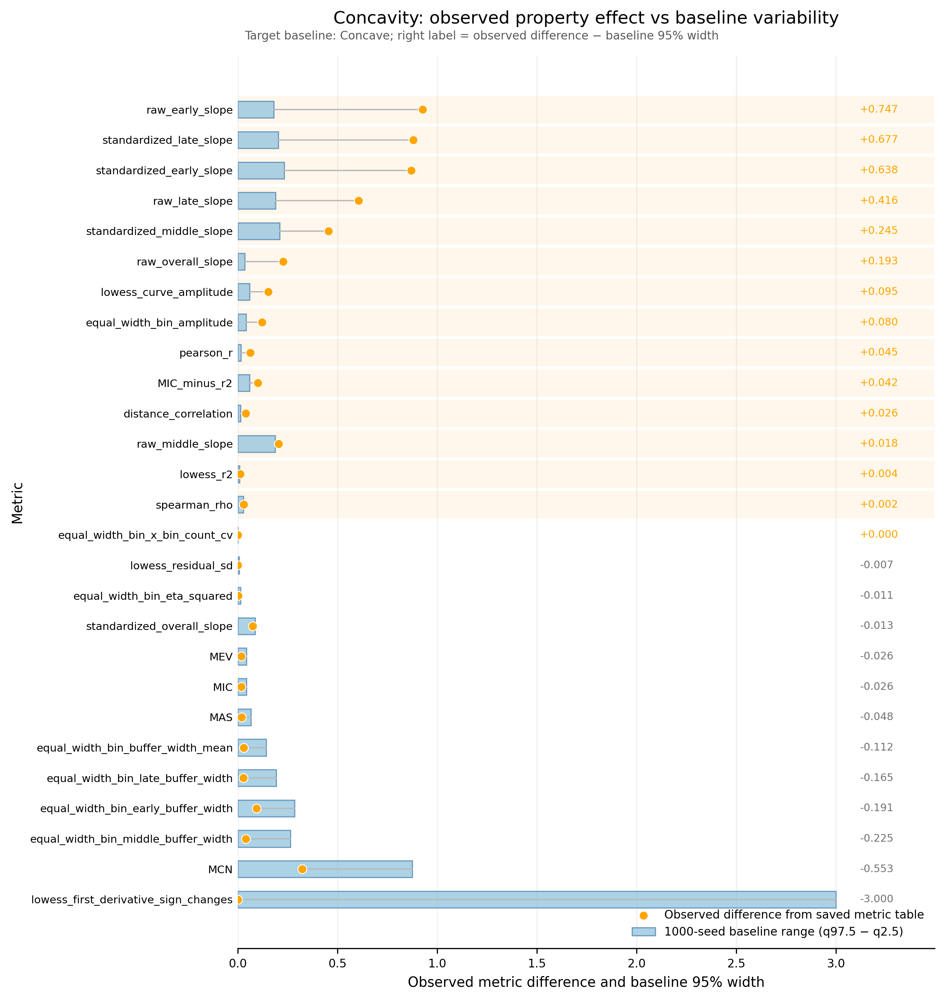

Plotting normalized figure: Concavity
Saved normalized figure: ./property_baseline_outputs/figures/Concavity_normalized_observed_vs_baseline95.png


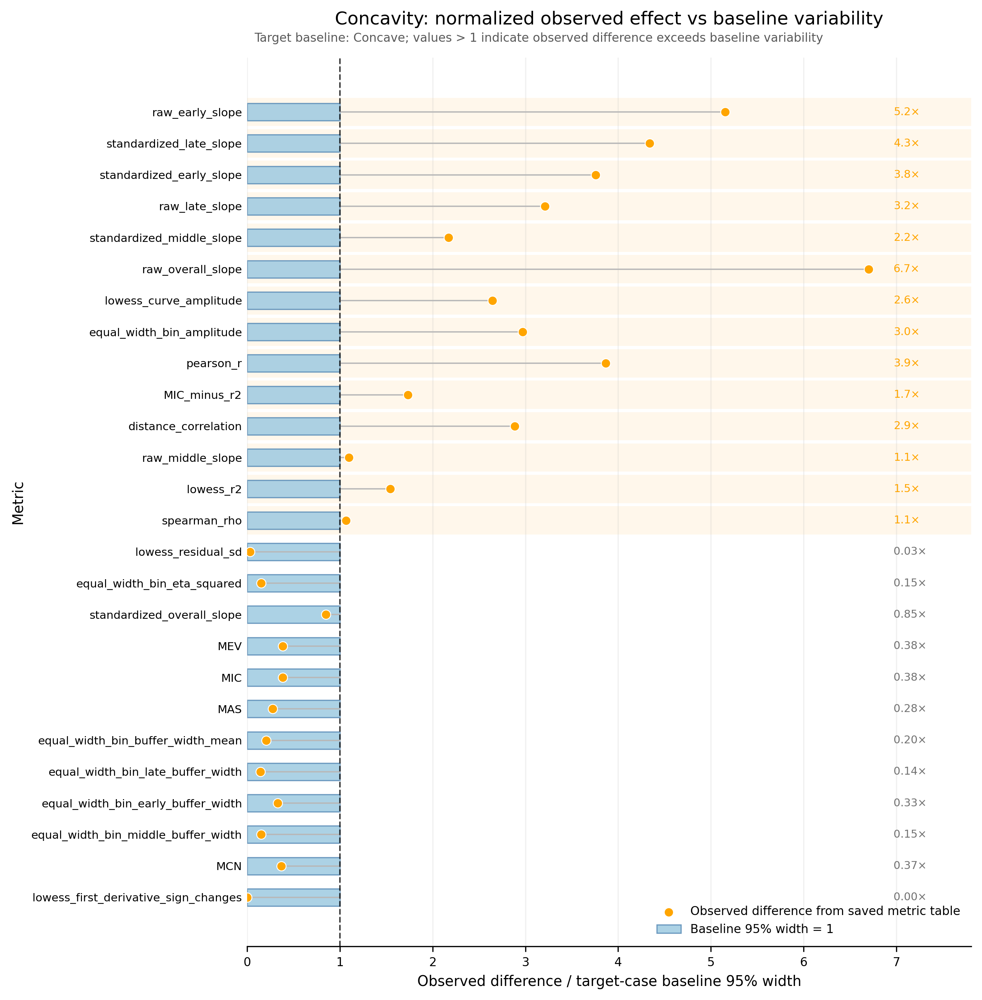

Plotting raw figure: Saturation
Saved raw figure: ./property_baseline_outputs/figures/Saturation_raw_observed_vs_baseline95.png


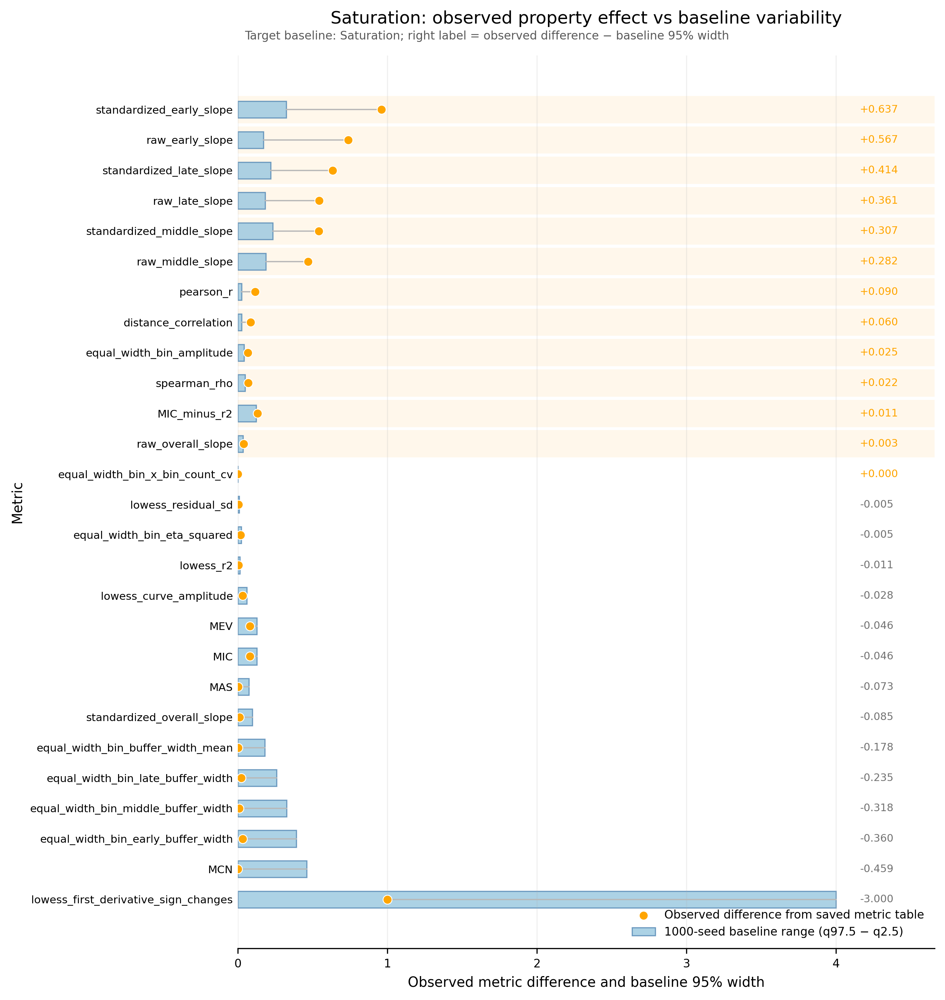

Plotting normalized figure: Saturation
Saved normalized figure: ./property_baseline_outputs/figures/Saturation_normalized_observed_vs_baseline95.png


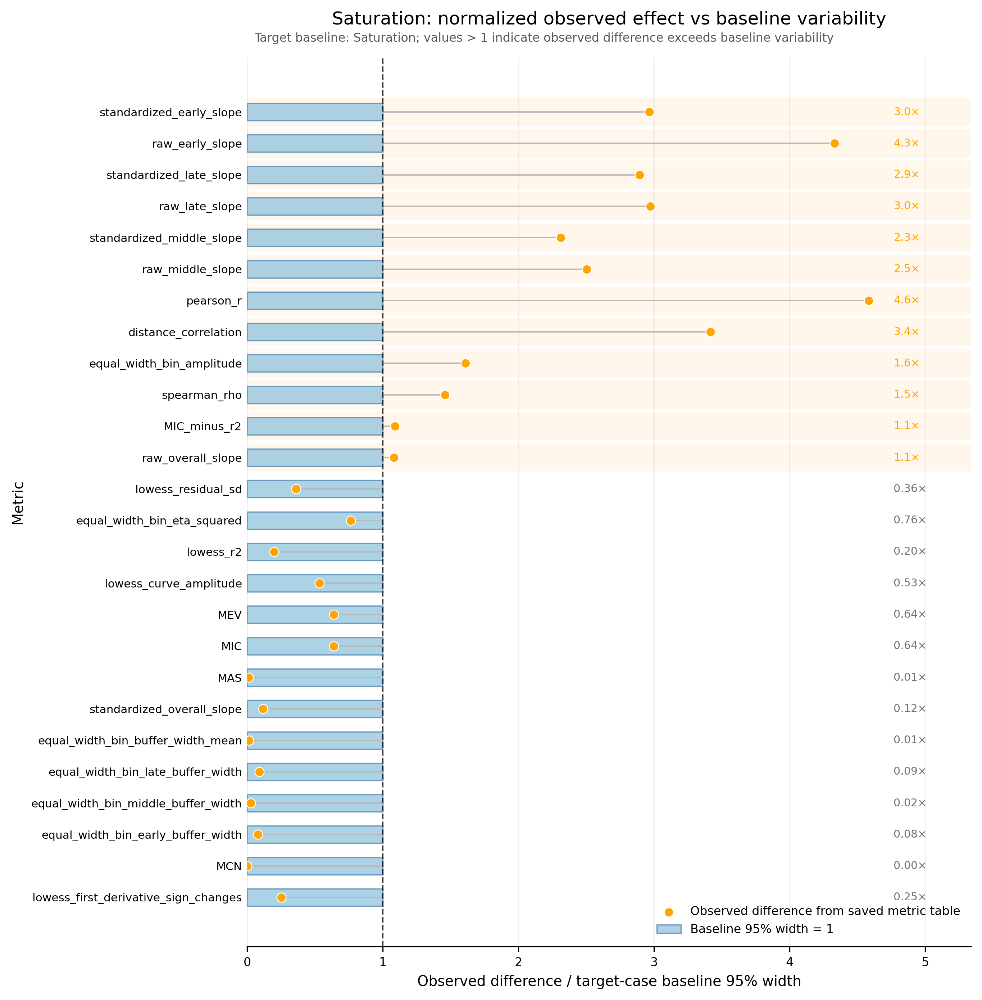

Plotting raw figure: Turning point
Saved raw figure: ./property_baseline_outputs/figures/Turning_point_raw_observed_vs_baseline95.png


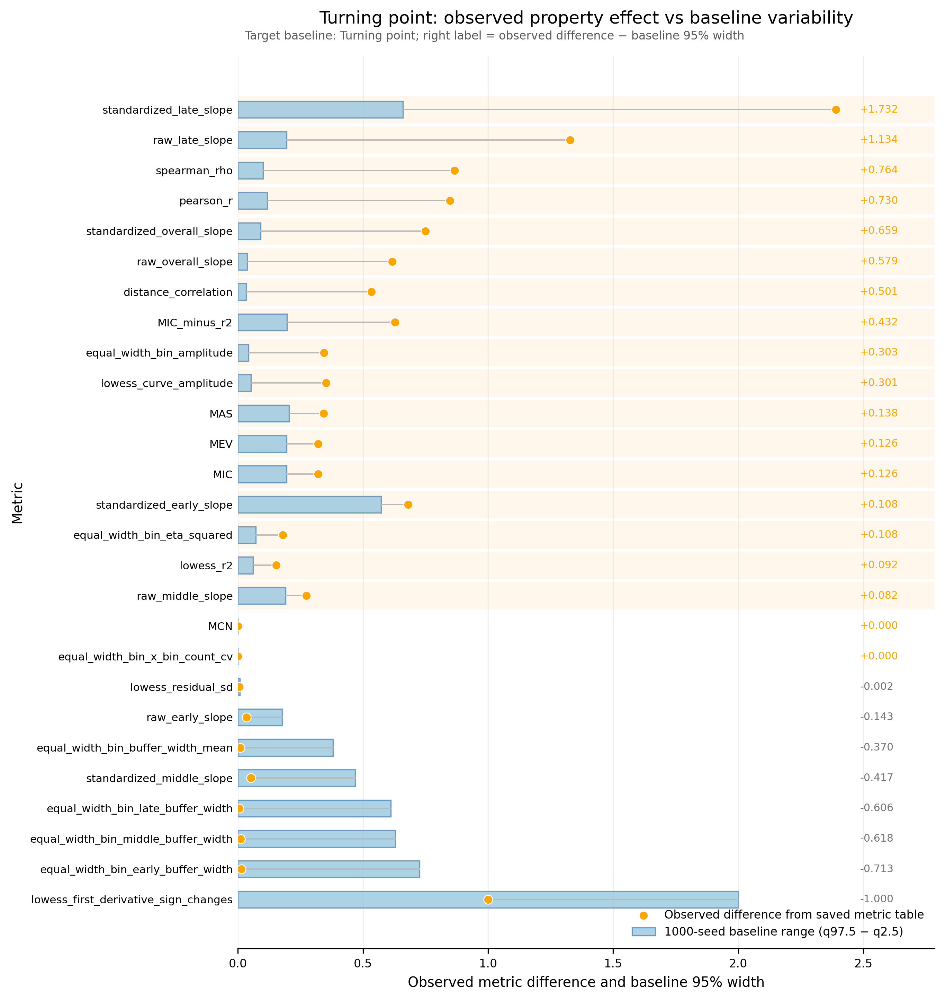

Plotting normalized figure: Turning point
Saved normalized figure: ./property_baseline_outputs/figures/Turning_point_normalized_observed_vs_baseline95.png


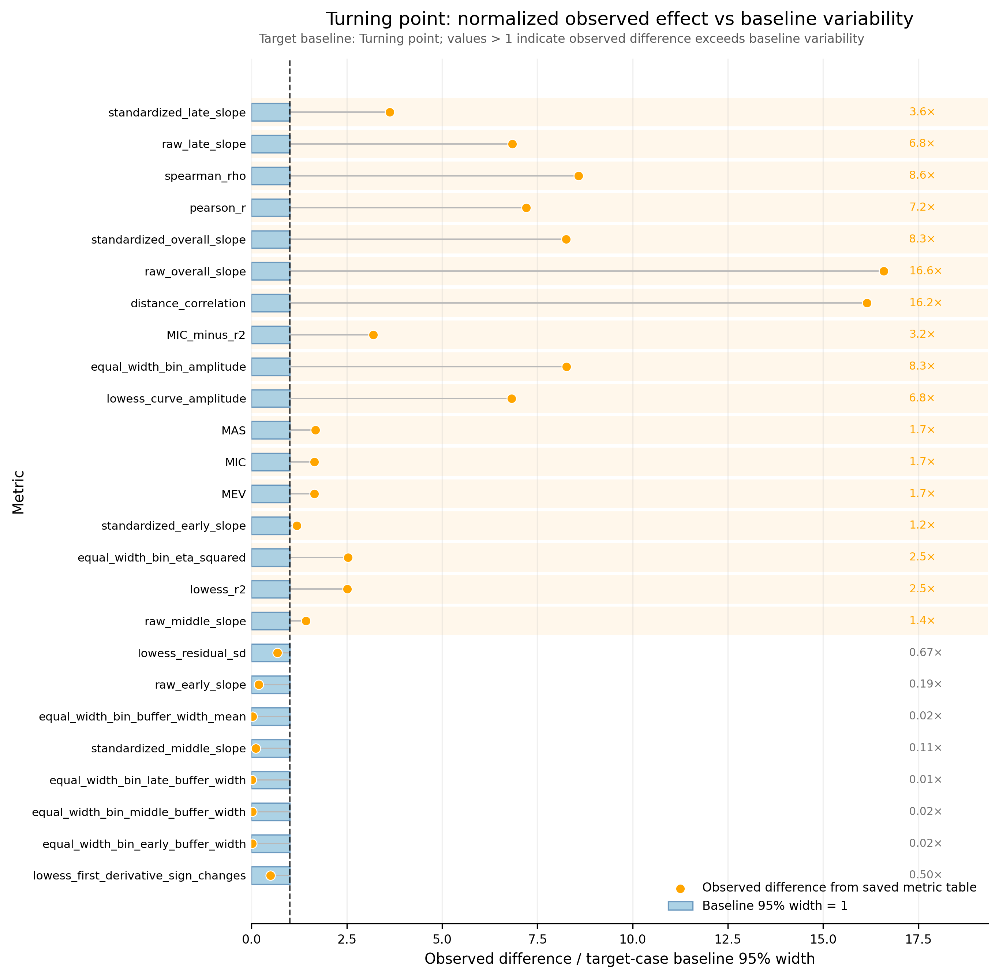

Plotting raw figure: Threshold
Saved raw figure: ./property_baseline_outputs/figures/Threshold_raw_observed_vs_baseline95.png


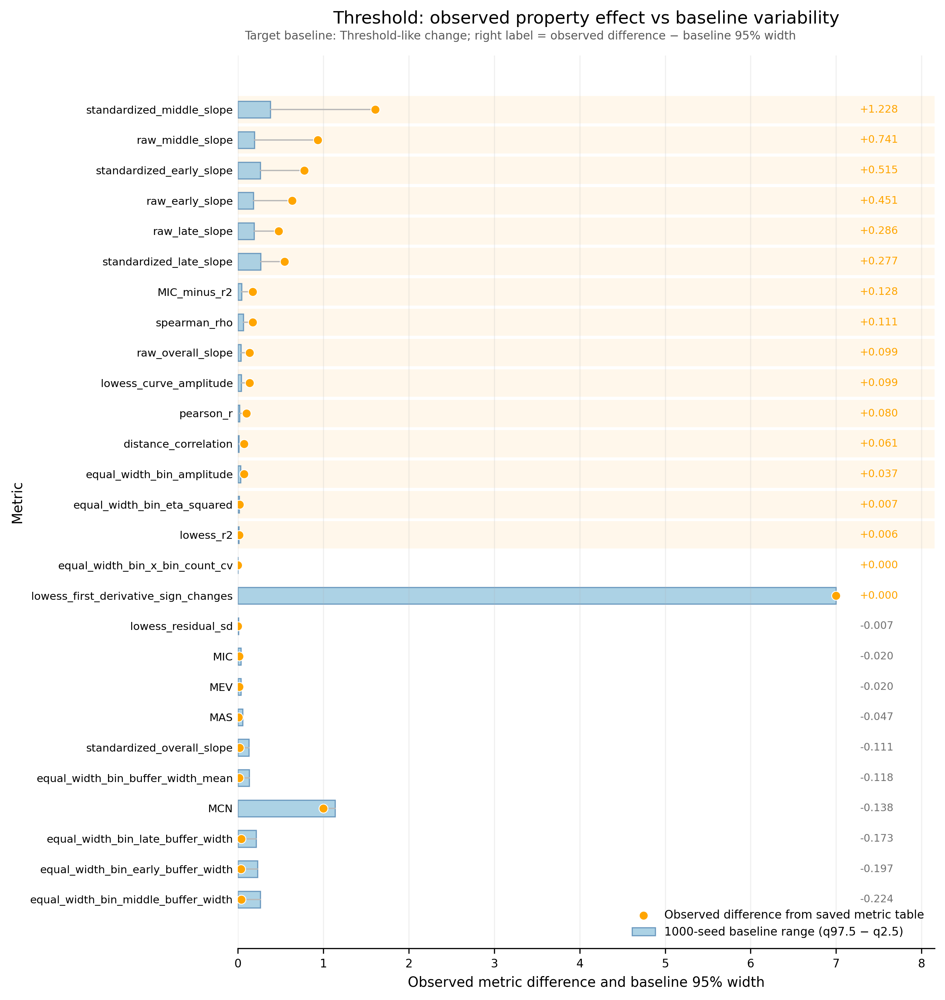

Plotting normalized figure: Threshold
Saved normalized figure: ./property_baseline_outputs/figures/Threshold_normalized_observed_vs_baseline95.png


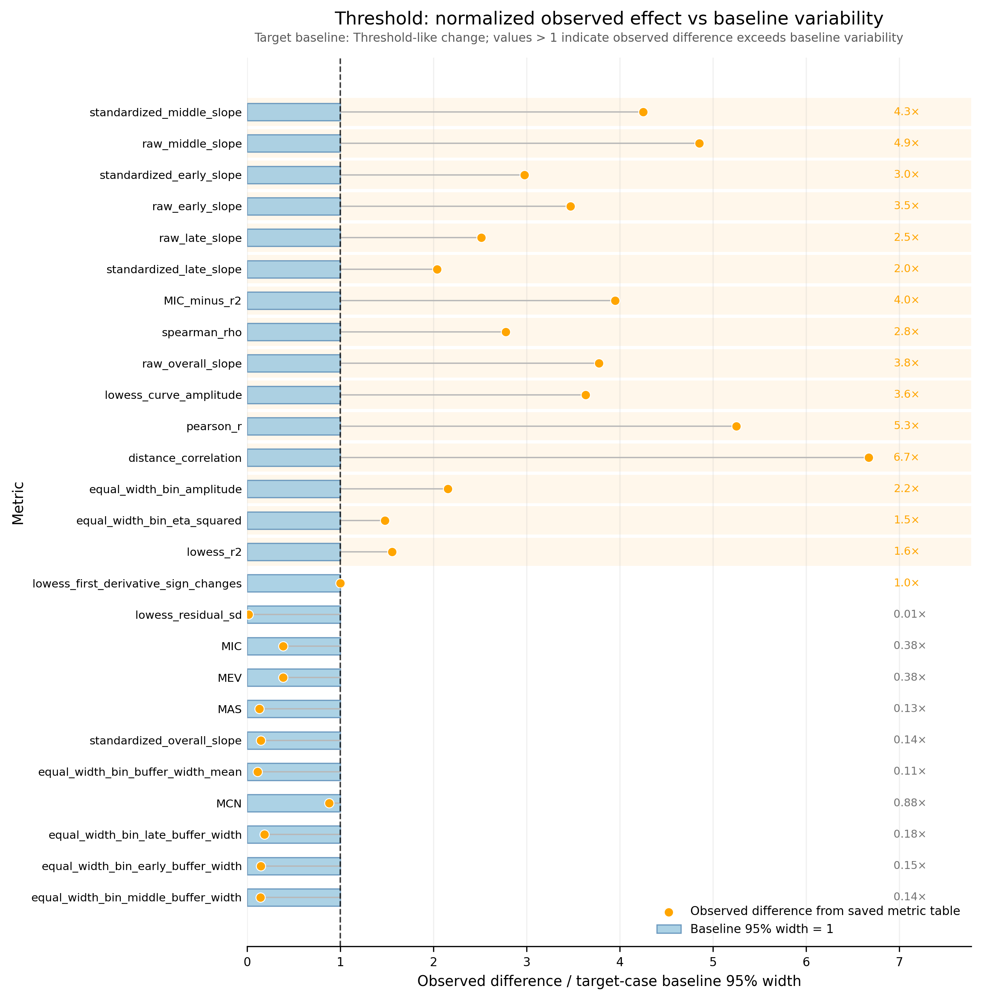

Plotting raw figure: Spread
Saved raw figure: ./property_baseline_outputs/figures/Spread_raw_observed_vs_baseline95.png


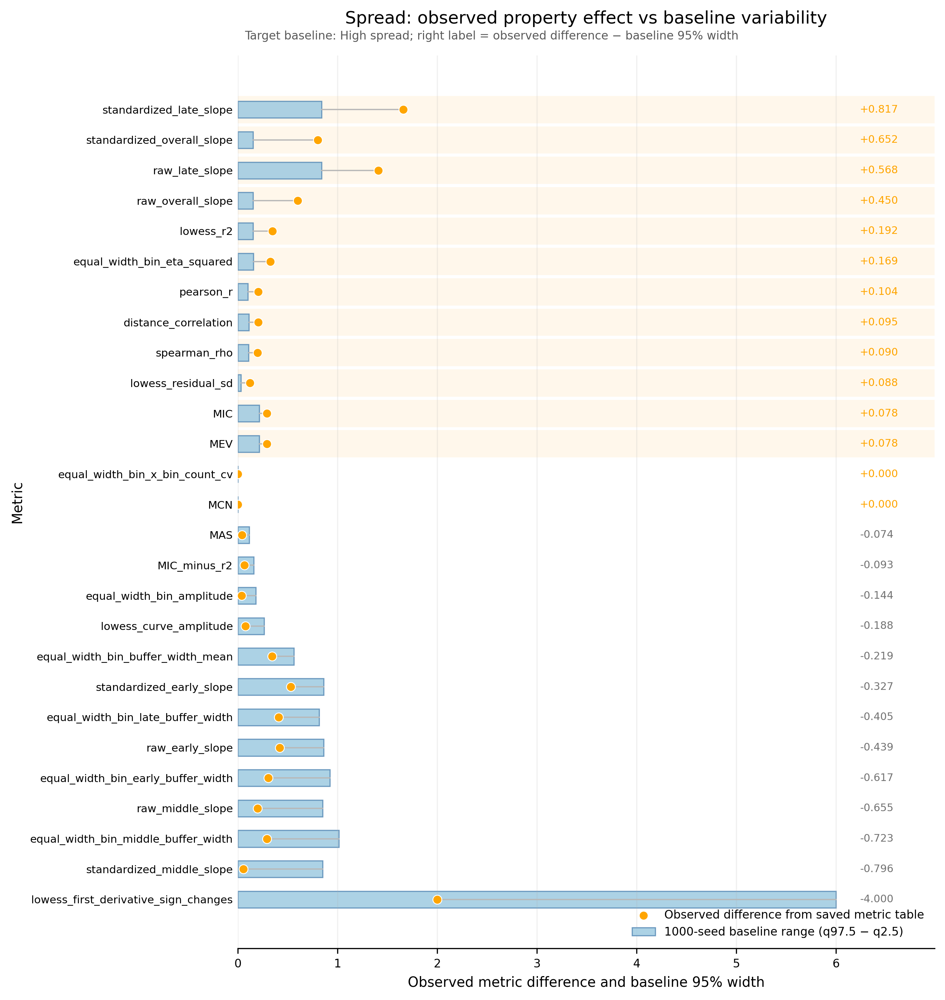

Plotting normalized figure: Spread
Saved normalized figure: ./property_baseline_outputs/figures/Spread_normalized_observed_vs_baseline95.png


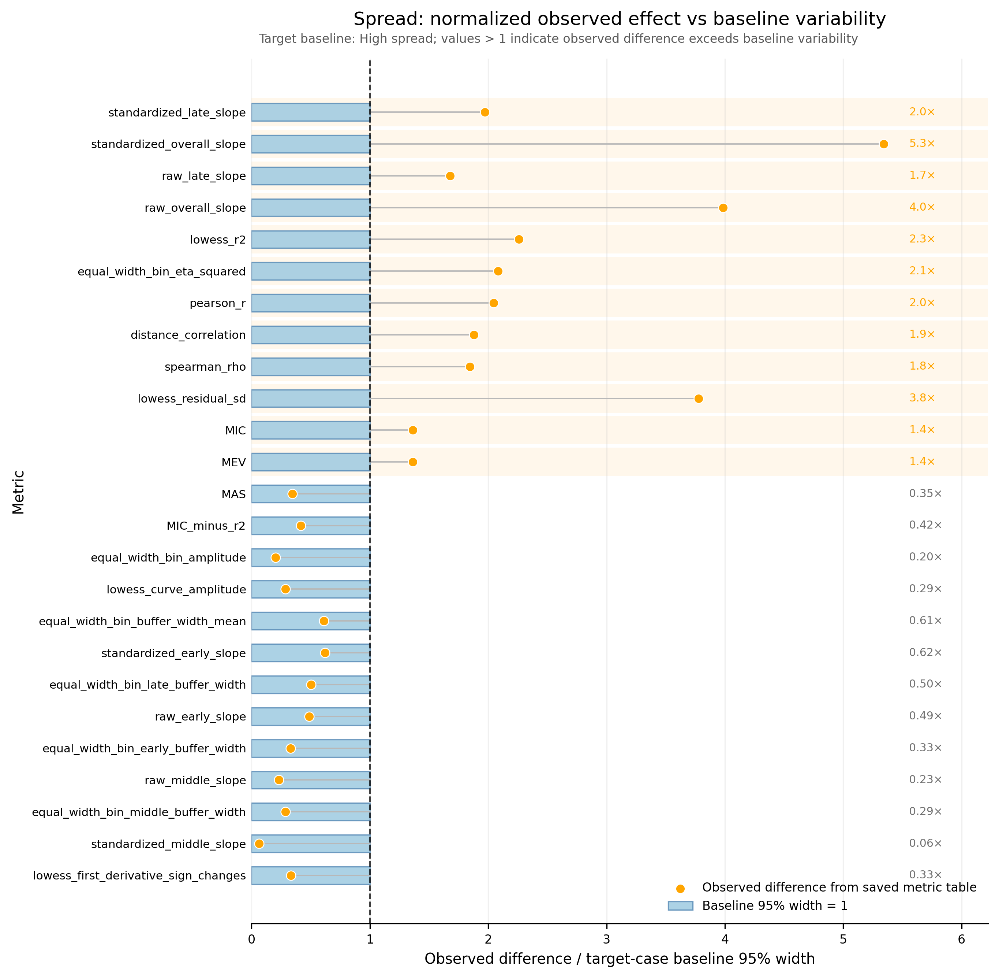

Plotting raw figure: Heteroscedasticity
Saved raw figure: ./property_baseline_outputs/figures/Heteroscedasticity_raw_observed_vs_baseline95.png


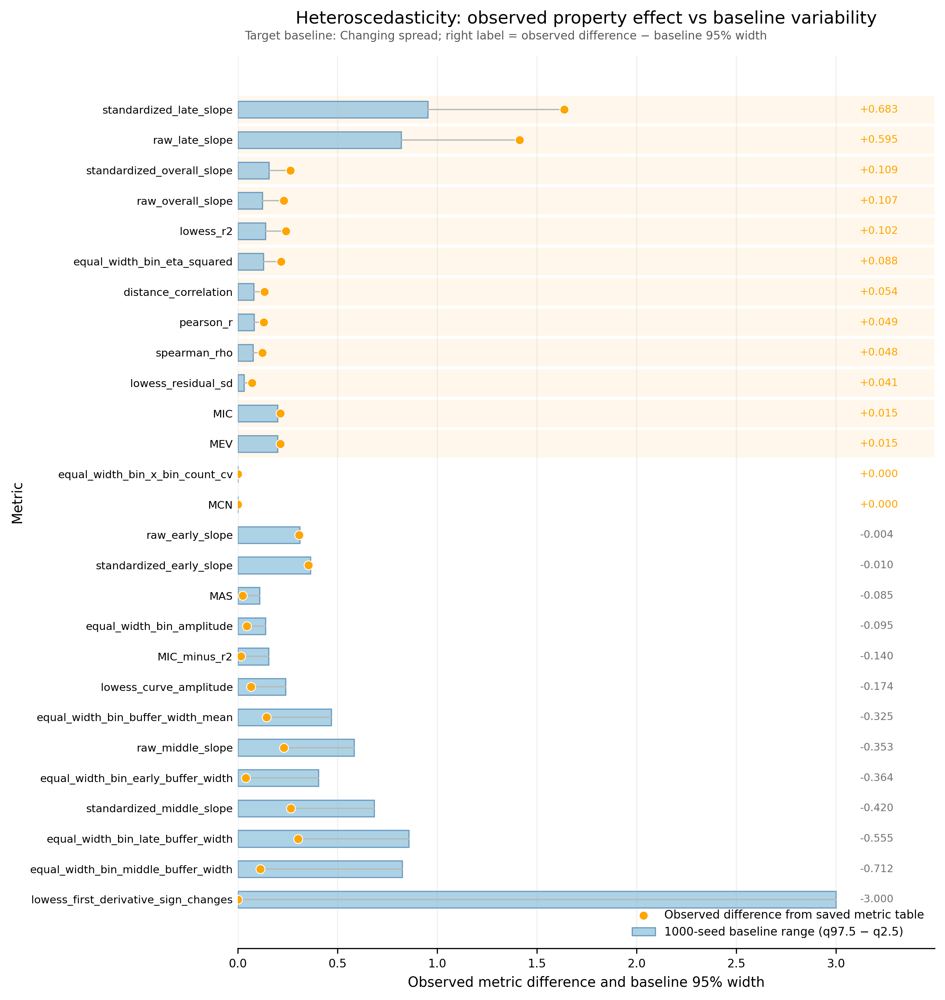

Plotting normalized figure: Heteroscedasticity
Saved normalized figure: ./property_baseline_outputs/figures/Heteroscedasticity_normalized_observed_vs_baseline95.png


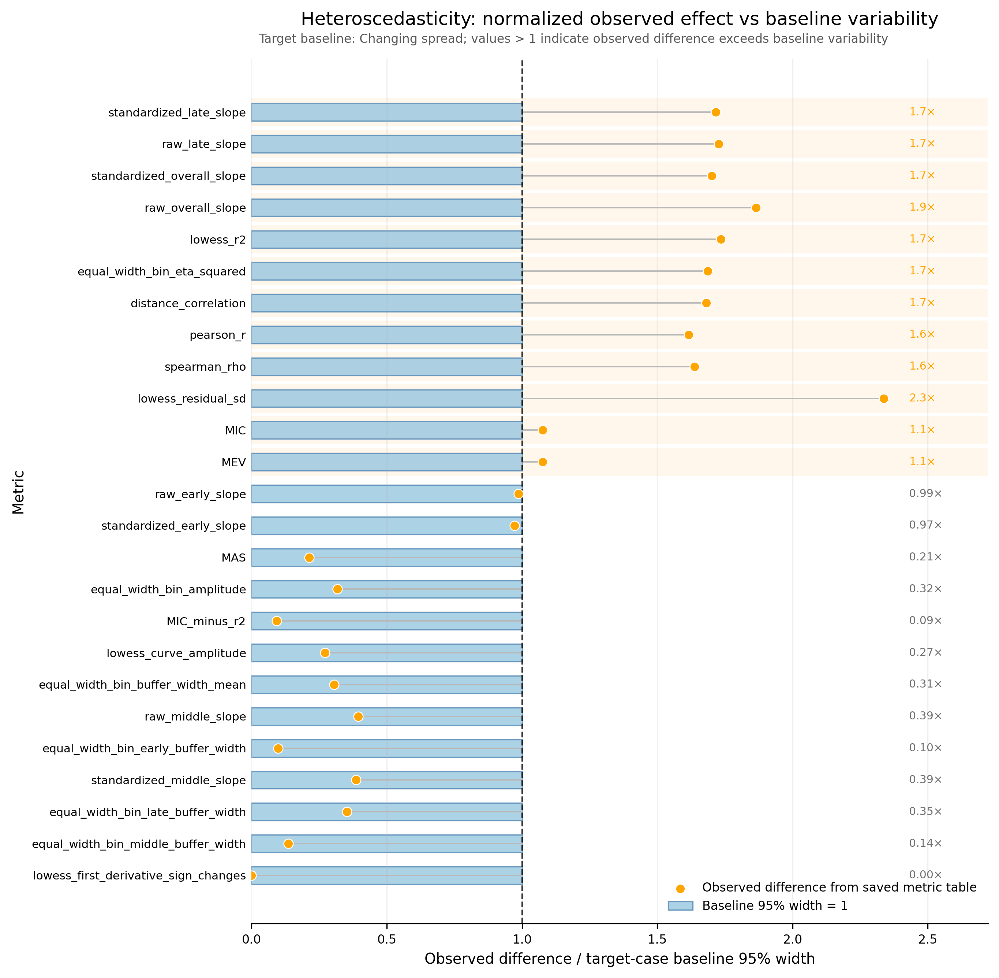

Plotting raw figure: Density
Saved raw figure: ./property_baseline_outputs/figures/Density_raw_observed_vs_baseline95.png


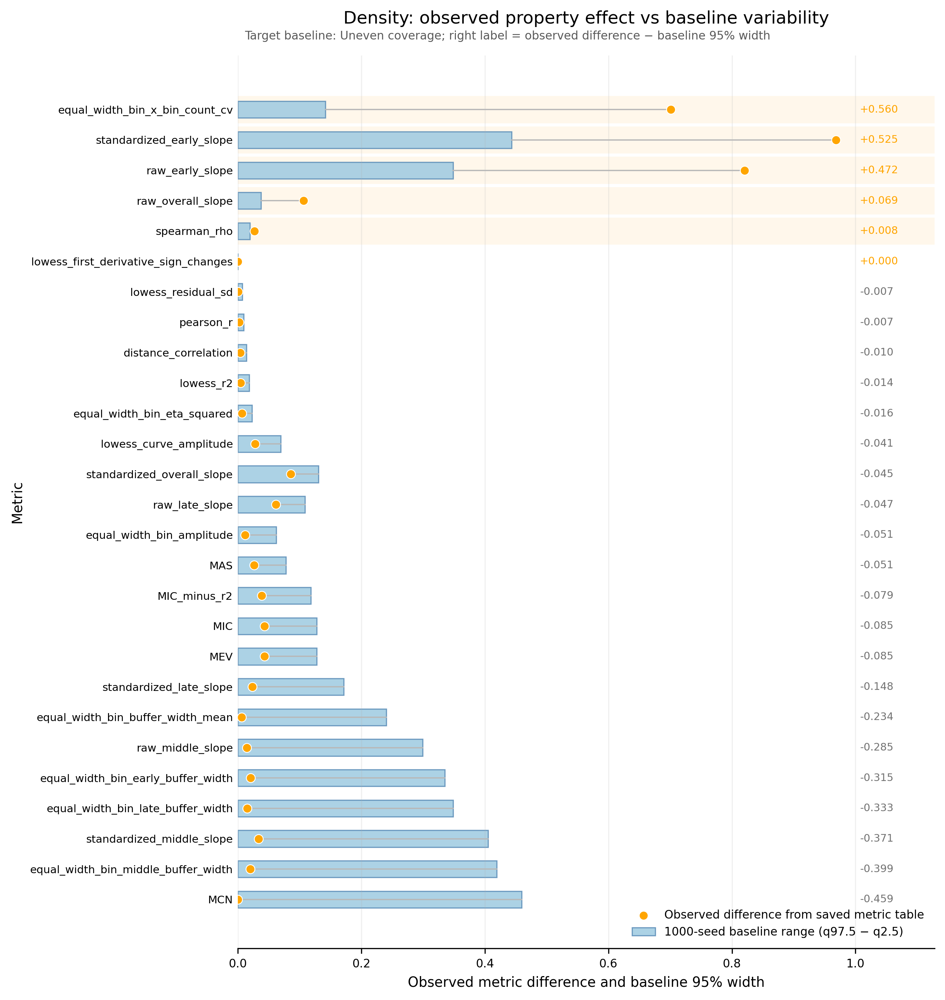

Plotting normalized figure: Density
Saved normalized figure: ./property_baseline_outputs/figures/Density_normalized_observed_vs_baseline95.png


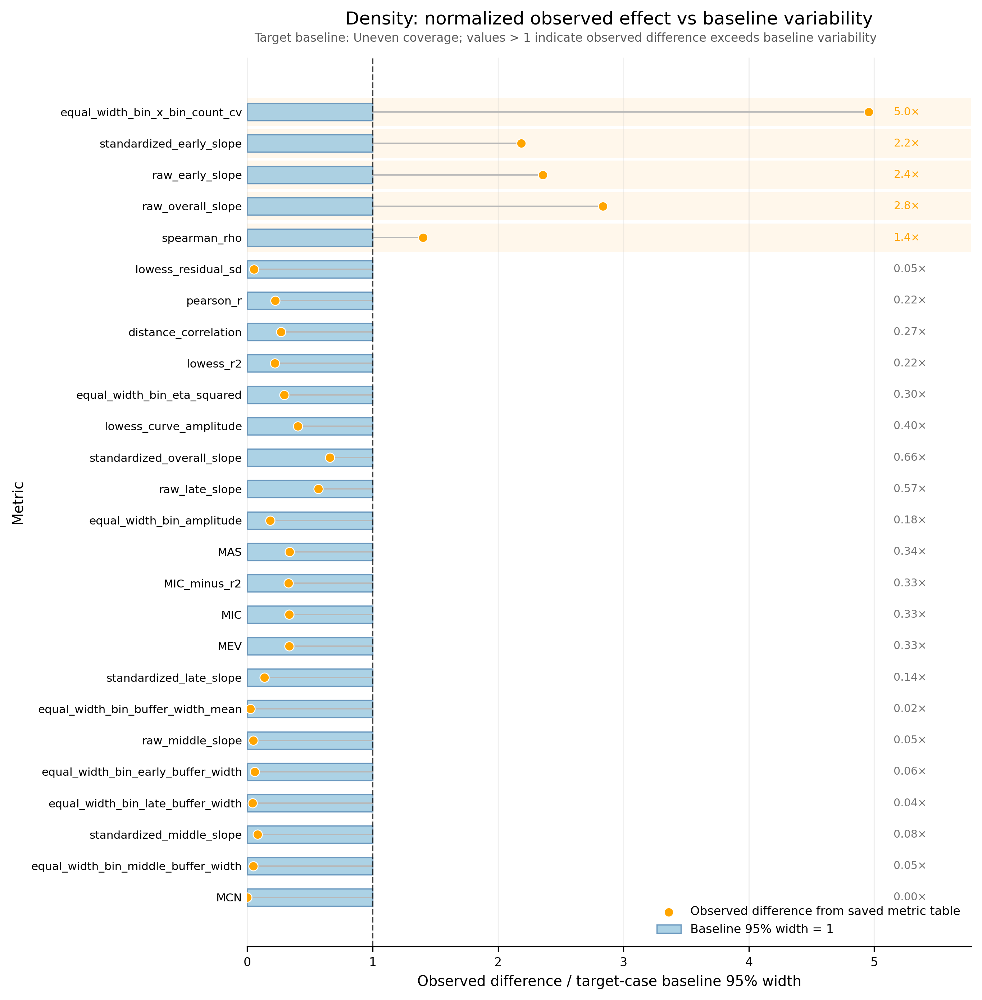

Plotting raw figure: Clustering
Saved raw figure: ./property_baseline_outputs/figures/Clustering_raw_observed_vs_baseline95.png


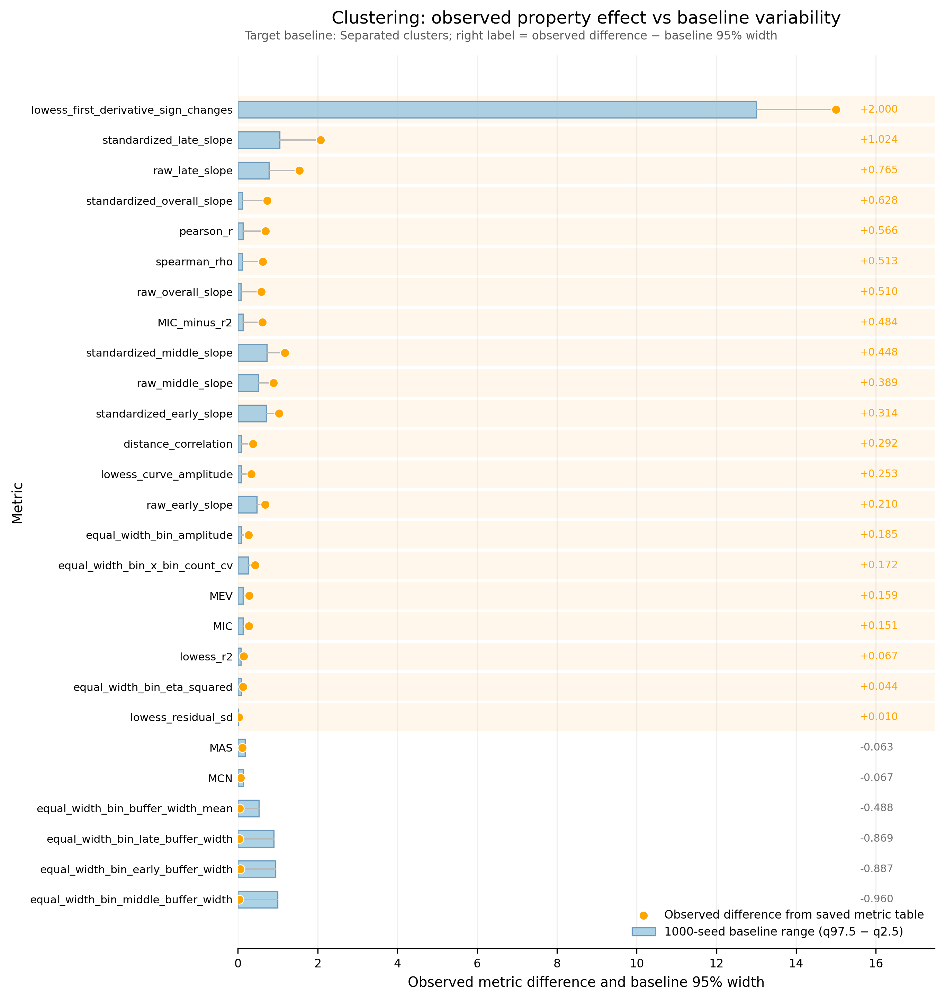

Plotting normalized figure: Clustering
Saved normalized figure: ./property_baseline_outputs/figures/Clustering_normalized_observed_vs_baseline95.png


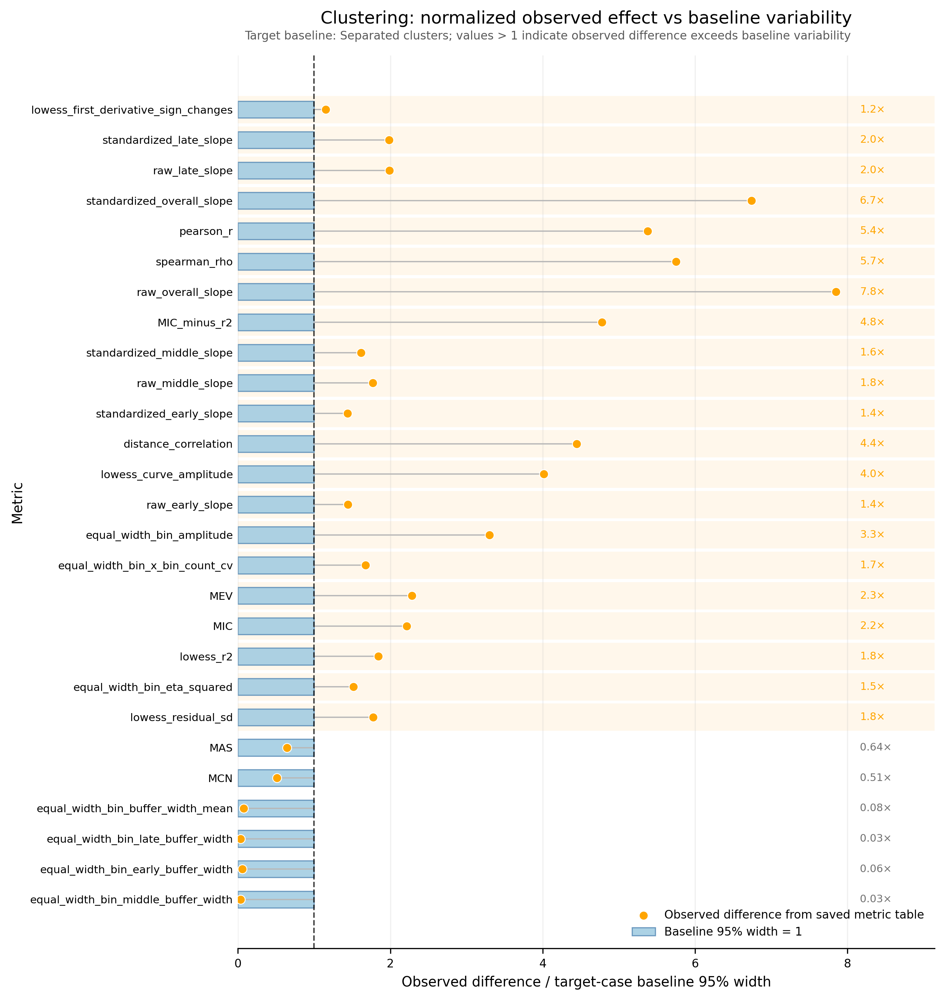

All figures saved to: ./property_baseline_outputs/figures


In [15]:
# ==========================================================
# Plot all properties:
# 1. Raw-scale figure for each property
# 2. Normalized figure for each property
# Figures are saved automatically
#
# Compatible with:
# all_property_results generated from no_certainty.xlsx
# ==========================================================

import os
import numpy as np
import matplotlib.pyplot as plt


# ----------------------------------------------------------
# Output directory
# ----------------------------------------------------------

figure_dir = "./property_baseline_outputs/figures"
os.makedirs(figure_dir, exist_ok=True)


def make_safe_filename(name):
    return (
        name
        .replace("/", "_")
        .replace("\\", "_")
        .replace(" ", "_")
        .replace("-", "_")
        .replace(":", "_")
    )


def get_case_info_from_result(result):
    """
    Extract case_a, case_b, and baseline_case from comparison_df.
    This replaces result["case_a_name"] and result["case_b_name"].
    """

    comparison_df = result["comparison_df"]

    if "case_a" in comparison_df.columns:
        case_a = comparison_df["case_a"].dropna().iloc[0]
    else:
        case_a = "case A"

    if "case_b" in comparison_df.columns:
        case_b = comparison_df["case_b"].dropna().iloc[0]
    else:
        case_b = "case B"

    if "baseline_case" in comparison_df.columns:
        baseline_case = comparison_df["baseline_case"].dropna().iloc[0]
    elif "baseline_case" in result.get("baseline_summary_df", {}).columns:
        baseline_case = result["baseline_summary_df"]["baseline_case"].dropna().iloc[0]
    else:
        baseline_case = case_b

    return case_a, case_b, baseline_case


# ==========================================================
# Raw-scale plot for one property
# ==========================================================

def plot_property_baseline_raw_save(
    property_name,
    all_property_results,
    top_k=None,
    figsize_width=9.2,
    row_height=0.36,
    save_dir=None,
    show=True,
):
    if property_name not in all_property_results:
        print(f"{property_name} not found.")
        print("Available properties:")
        print(list(all_property_results.keys()))
        return

    result = all_property_results[property_name]

    comparison_df = result["comparison_df"].copy()
    case_a, case_b, baseline_case = get_case_info_from_result(result)

    plot_df = comparison_df.replace([np.inf, -np.inf], np.nan)

    plot_df = plot_df.dropna(
        subset=[
            "baseline_95_width",
            "observed_difference",
        ]
    )

    if plot_df.empty:
        print(f"No valid data to plot for {property_name}.")
        return

    # observed - 1000-run baseline width, no absolute value
    if "observed_minus_baseline95" not in plot_df.columns:
        plot_df["observed_minus_baseline95"] = (
            plot_df["observed_difference"] - plot_df["baseline_95_width"]
        )

    # Sort by observed - baseline 95% width from large to small
    plot_df = plot_df.sort_values(
        "observed_minus_baseline95",
        ascending=False,
    ).reset_index(drop=True)

    if top_k is not None:
        plot_df = plot_df.head(top_k).copy()

    plot_df["exceeds_baseline"] = (
        plot_df["observed_minus_baseline95"] > 0
    )

    n_metrics = len(plot_df)
    y_pos = np.arange(n_metrics)

    fig, ax = plt.subplots(
        figsize=(figsize_width, max(6.5, row_height * n_metrics)),
        dpi=300,
    )

    # Highlight rows where observed difference > baseline 95% width
    for i, exceeds in enumerate(plot_df["exceeds_baseline"]):
        if exceeds:
            ax.axhspan(
                i - 0.45,
                i + 0.45,
                alpha=0.08,
                color="orange",
                linewidth=0,
            )

    # Baseline 95% width
    ax.barh(
        y_pos,
        plot_df["baseline_95_width"],
        height=0.55,
        color="#9ecae1",
        edgecolor="#5b8db8",
        linewidth=0.8,
        alpha=0.85,
        label="1000-seed baseline range (q97.5 − q2.5)",
    )

    # Connector between baseline width and observed difference
    for i, row in plot_df.iterrows():
        ax.plot(
            [row["baseline_95_width"], row["observed_difference"]],
            [i, i],
            color="0.72",
            linewidth=0.9,
            zorder=2,
        )

    # Observed difference point
    ax.scatter(
        plot_df["observed_difference"],
        y_pos,
        s=38,
        color="orange",
        edgecolor="white",
        linewidth=0.6,
        zorder=4,
        label=f"Observed difference from saved metric table",
    )

    # ------------------------------------------------------
    # Right-side label:
    # observed difference - baseline 95% width
    # ------------------------------------------------------
    x_max = np.nanmax([
        plot_df["baseline_95_width"].max(),
        plot_df["observed_difference"].max(),
    ])

    x_text = x_max * 1.04 if x_max > 0 else 1

    for i, row in plot_df.iterrows():

        gap = row["observed_minus_baseline95"]

        if gap >= 0:
            label = f"+{gap:.3f}"
            color = "orange"
        else:
            label = f"{gap:.3f}"
            color = "0.45"

        ax.text(
            x_text,
            i,
            label,
            va="center",
            ha="left",
            fontsize=7.2,
            color=color,
        )

    ax.set_yticks(y_pos)
    ax.set_yticklabels(
        plot_df["metric"],
        fontsize=7.5,
    )

    ax.invert_yaxis()

    ax.set_xlabel(
        "Observed metric difference and baseline 95% width",
        fontsize=9.5,
    )

    ax.set_ylabel(
        "Metric",
        fontsize=9.5,
    )

    ax.set_title(
        f"{property_name}: observed property effect vs baseline variability",
        fontsize=12,
        pad=22,
    )

    ax.text(
        0.01,
        1.015,
        f"Target baseline: {baseline_case}; right label = observed difference − baseline 95% width",
        transform=ax.transAxes,
        ha="left",
        va="bottom",
        fontsize=8,
        color="0.35",
    )

    ax.grid(
        axis="x",
        alpha=0.18,
        linewidth=0.8,
    )

    ax.tick_params(axis="x", labelsize=8)
    ax.tick_params(axis="y", length=0)

    for spine in ["top", "right", "left"]:
        ax.spines[spine].set_visible(False)

    ax.legend(
        frameon=False,
        fontsize=8,
        loc="lower right",
    )

    ax.set_xlim(0, x_text * 1.12)

    plt.tight_layout()

    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)

        safe_name = make_safe_filename(property_name)
        save_path = os.path.join(
            save_dir,
            f"{safe_name}_raw_observed_vs_baseline95.png"
        )
        fig.savefig(
            save_path,
            dpi=300,
            bbox_inches="tight",
        )

        print(f"Saved raw figure: {save_path}")

    if show:
        plt.show()
    else:
        plt.close(fig)


# ==========================================================
# Normalized plot for one property
# ==========================================================

def plot_property_baseline_normalized_save(
    property_name,
    all_property_results,
    top_k=None,
    figsize_width=9.2,
    row_height=0.36,
    save_dir=None,
    show=True,
):
    if property_name not in all_property_results:
        print(f"{property_name} not found.")
        print("Available properties:")
        print(list(all_property_results.keys()))
        return

    result = all_property_results[property_name]

    comparison_df = result["comparison_df"].copy()
    case_a, case_b, baseline_case = get_case_info_from_result(result)

    plot_df = comparison_df.replace([np.inf, -np.inf], np.nan)

    plot_df = plot_df.dropna(
        subset=[
            "baseline_95_width",
            "observed_difference",
        ]
    )

    plot_df = plot_df[plot_df["baseline_95_width"] > 0].copy()

    if plot_df.empty:
        print(f"No valid normalized data to plot for {property_name}.")
        return

    if "observed_minus_baseline95" not in plot_df.columns:
        plot_df["observed_minus_baseline95"] = (
            plot_df["observed_difference"] - plot_df["baseline_95_width"]
        )

    plot_df["observed_ratio"] = (
        plot_df["observed_difference"] / plot_df["baseline_95_width"]
    )

    # Sort by observed - baseline95 from large to small
    plot_df = plot_df.sort_values(
        "observed_minus_baseline95",
        ascending=False,
    ).reset_index(drop=True)

    if top_k is not None:
        plot_df = plot_df.head(top_k).copy()

    plot_df["exceeds_baseline"] = (
        plot_df["observed_minus_baseline95"] > 0
    )

    n_metrics = len(plot_df)
    y_pos = np.arange(n_metrics)

    fig, ax = plt.subplots(
        figsize=(figsize_width, max(6.5, row_height * n_metrics)),
        dpi=300,
    )

    # Highlight rows where observed difference > baseline 95% width
    for i, exceeds in enumerate(plot_df["exceeds_baseline"]):
        if exceeds:
            ax.axhspan(
                i - 0.45,
                i + 0.45,
                alpha=0.08,
                color="orange",
                linewidth=0,
            )

    # Normalized baseline width = 1
    ax.barh(
        y_pos,
        np.ones(n_metrics),
        height=0.55,
        color="#9ecae1",
        edgecolor="#5b8db8",
        linewidth=0.8,
        alpha=0.85,
        label="Baseline 95% width = 1",
    )

    observed_ratio = plot_df["observed_ratio"].values

    # Connector from baseline = 1 to observed ratio
    for i, ratio in enumerate(observed_ratio):
        ax.plot(
            [1, ratio],
            [i, i],
            color="0.72",
            linewidth=0.9,
            zorder=2,
        )

    # Observed ratio point
    ax.scatter(
        observed_ratio,
        y_pos,
        s=38,
        color="orange",
        edgecolor="white",
        linewidth=0.6,
        zorder=4,
        label=f"Observed difference from saved metric table",
    )

    # Threshold line
    ax.axvline(
        1,
        color="black",
        linestyle="--",
        linewidth=1.0,
        alpha=0.75,
    )

    # Right-side label: ratio
    x_max = max(np.nanmax(observed_ratio), 1)
    x_text = x_max * 1.04 if x_max > 0 else 1

    for i, row in plot_df.iterrows():

        ratio = row["observed_ratio"]

        if ratio >= 1:
            label = f"{ratio:.1f}×"
            color = "orange"
        else:
            label = f"{ratio:.2f}×"
            color = "0.45"

        ax.text(
            x_text,
            i,
            label,
            va="center",
            ha="left",
            fontsize=7.2,
            color=color,
        )

    ax.set_yticks(y_pos)
    ax.set_yticklabels(
        plot_df["metric"],
        fontsize=7.5,
    )

    ax.invert_yaxis()

    ax.set_xlabel(
        "Observed difference / target-case baseline 95% width",
        fontsize=9.5,
    )

    ax.set_ylabel(
        "Metric",
        fontsize=9.5,
    )

    ax.set_title(
        f"{property_name}: normalized observed effect vs baseline variability",
        fontsize=12,
        pad=22,
    )

    ax.text(
        0.01,
        1.015,
        f"Target baseline: {baseline_case}; values > 1 indicate observed difference exceeds baseline variability",
        transform=ax.transAxes,
        ha="left",
        va="bottom",
        fontsize=8,
        color="0.35",
    )

    ax.grid(
        axis="x",
        alpha=0.18,
        linewidth=0.8,
    )

    ax.tick_params(axis="x", labelsize=8)
    ax.tick_params(axis="y", length=0)

    for spine in ["top", "right", "left"]:
        ax.spines[spine].set_visible(False)

    ax.legend(
        frameon=False,
        fontsize=8,
        loc="lower right",
    )

    ax.set_xlim(0, x_text * 1.12)

    plt.tight_layout()

    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)

        safe_name = make_safe_filename(property_name)
        save_path = os.path.join(
            save_dir,
            f"{safe_name}_normalized_observed_vs_baseline95.png"
        )
        fig.savefig(
            save_path,
            dpi=300,
            bbox_inches="tight",
        )

        print(f"Saved normalized figure: {save_path}")

    if show:
        plt.show()
    else:
        plt.close(fig)


# ==========================================================
# Run plots for all properties
# ==========================================================

for property_name in properties_to_run:

    print(f"Plotting raw figure: {property_name}")

    plot_property_baseline_raw_save(
        property_name=property_name,
        all_property_results=all_property_results,
        top_k=None,
        save_dir=figure_dir,
        show=True,      # set False if you only want to save
    )

    print(f"Plotting normalized figure: {property_name}")

    plot_property_baseline_normalized_save(
        property_name=property_name,
        all_property_results=all_property_results,
        top_k=None,
        save_dir=figure_dir,
        show=True,      # set False if you only want to save
    )

print(f"All figures saved to: {figure_dir}")

In [16]:
# ==========================================================
# Save all metrics where orange point > blue bar
# i.e., saved observed difference > 1000-seed baseline range
# ==========================================================

import os
import numpy as np
import pandas as pd

output_dir = "./property_baseline_outputs"
os.makedirs(output_dir, exist_ok=True)

# ----------------------------------------------------------
# Rebuild all_comparison_df from all_property_results
# ----------------------------------------------------------

all_comparison_records = []

for property_name, result in all_property_results.items():

    df = result["comparison_df"].copy()

    df = df.replace([np.inf, -np.inf], np.nan)

    # Ensure property column exists
    df["property"] = property_name

    # Ensure observed_minus_baseline95 exists
    if "observed_minus_baseline95" not in df.columns:
        df["observed_minus_baseline95"] = (
            df["observed_difference"] - df["baseline_95_width"]
        )

    # Ensure ratio exists
    if "ratio_to_baseline_95_width" not in df.columns:
        df["ratio_to_baseline_95_width"] = (
            df["observed_difference"] / df["baseline_95_width"]
        )

    all_comparison_records.append(df)

all_comparison_df = pd.concat(
    all_comparison_records,
    ignore_index=True
)

all_comparison_df = all_comparison_df.replace([np.inf, -np.inf], np.nan)


# ----------------------------------------------------------
# Filter:
# orange point > blue bar
# equivalent to:
# observed_difference > baseline_95_width
# ratio_to_baseline_95_width > 1
# observed_minus_baseline95 > 0
# ----------------------------------------------------------

orange_gt_blue_df = all_comparison_df[
    all_comparison_df["observed_difference"]
    > all_comparison_df["baseline_95_width"]
].copy()

# Optional: add a clearer logical column
orange_gt_blue_df["orange_larger_than_blue"] = True

# Sort by property first, then by gap from large to small
orange_gt_blue_df = orange_gt_blue_df.sort_values(
    ["property", "observed_minus_baseline95"],
    ascending=[True, False]
).reset_index(drop=True)


# ----------------------------------------------------------
# Select useful columns
# ----------------------------------------------------------

preferred_cols = [
    "property",
    "case_a",
    "case_b",
    "baseline_case",
    "baseline_source_property",
    "metric",
    "case_a_value",
    "case_b_value",
    "observed_difference",
    "baseline_95_width",
    "observed_minus_baseline95",
    "ratio_to_baseline_95_width",
    "baseline_mean",
    "baseline_sd",
    "baseline_min",
    "baseline_max",
    "baseline_q025",
    "baseline_q975",
    "baseline_range",
    "larger_than_baseline_95_width",
    "larger_than_baseline_range",
]

existing_cols = [
    c for c in preferred_cols
    if c in orange_gt_blue_df.columns
]

orange_gt_blue_df = orange_gt_blue_df[existing_cols].copy()


# ----------------------------------------------------------
# Save to CSV
# ----------------------------------------------------------

orange_gt_blue_path = os.path.join(
    output_dir,
    "all_properties_orange_gt_blue_metrics.csv"
)

orange_gt_blue_df.round(4).to_csv(
    orange_gt_blue_path,
    index=False,
    encoding="utf-8-sig"
)

print(f"Saved orange > blue metrics to: {orange_gt_blue_path}")
print(f"Number of metrics: {len(orange_gt_blue_df)}")

display(orange_gt_blue_df)

Saved orange > blue metrics to: ./property_baseline_outputs/all_properties_orange_gt_blue_metrics.csv
Number of metrics: 177


,property,case_a,case_b,baseline_case,baseline_source_property,metric,case_a_value,case_b_value,observed_difference,baseline_95_width,...,ratio_to_baseline_95_width,baseline_mean,baseline_sd,baseline_min,baseline_max,baseline_q025,baseline_q975,baseline_range,larger_than_baseline_95_width,larger_than_baseline_range
0,Clustering,Single cloud,Separated clusters,Separated clusters,Clustering,lowess_first_derivative_sign_changes,0.0000,15.0000,15.0000,13.000000,...,1.153846,10.637000,3.296984,2.000000,27.000000,5.000000,18.000000,25.000000,True,False
1,Clustering,Single cloud,Separated clusters,Separated clusters,Clustering,standardized_late_slope,0.9797,-1.0877,2.0674,1.042976,...,1.982213,-0.018312,0.273068,-0.936338,0.887234,-0.558623,0.484353,1.823572,True,True
2,Clustering,Single cloud,Separated clusters,Separated clusters,Clustering,raw_late_slope,0.7626,-0.7778,1.5404,0.775045,...,1.987498,-0.013515,0.197962,-0.663577,0.643101,-0.409188,0.365856,1.306678,True,True
3,Clustering,Single cloud,Separated clusters,Separated clusters,Clustering,standardized_overall_slope,0.8952,0.1579,0.7373,0.109408,...,6.739014,0.210296,0.028775,0.106447,0.329564,0.154894,0.264301,0.223117,True,True
4,Clustering,Single cloud,Separated clusters,Separated clusters,Clustering,pearson_r,0.9853,0.2905,0.6948,0.129213,...,5.377184,0.270386,0.032645,0.148605,0.370632,0.204735,0.333948,0.222028,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172,Turning point,No turning point,Turning point,Turning point,Turning point,MIC,1.0000,0.6795,0.3205,0.194063,...,1.651528,0.817630,0.050029,0.654362,0.973029,0.723436,0.917499,0.318667,True,True
173,Turning point,No turning point,Turning point,Turning point,Turning point,standardized_early_slope,1.1159,1.7962,0.6803,0.571960,...,1.189420,1.930334,0.147757,1.498104,2.409519,1.636530,2.208489,0.911415,True,False
174,Turning point,No turning point,Turning point,Turning point,Turning point,equal_width_bin_eta_squared,0.9589,0.7797,0.1792,0.070868,...,2.528640,0.818299,0.018485,0.760475,0.866957,0.781477,0.852345,0.106482,True,True
175,Turning point,No turning point,Turning point,Turning point,Turning point,lowess_r2,0.9692,0.8166,0.1526,0.060739,...,2.512369,0.856937,0.014969,0.808326,0.895084,0.825548,0.886288,0.086758,True,True


In [17]:
# ==========================================================
# Extract top 3 and top 5 normalized metrics for each property
#
# Normalized score:
#   observed_ratio = observed_difference / baseline_95_width
#
# Rule:
#   If both raw slope and standardized slope exist,
#   keep raw slope and remove standardized slope.
# ==========================================================

import os
import numpy as np
import pandas as pd

output_dir = "./property_baseline_outputs"
os.makedirs(output_dir, exist_ok=True)


# ----------------------------------------------------------
# 1. Rebuild all comparison results
# ----------------------------------------------------------

all_comparison_records = []

for property_name, result in all_property_results.items():

    df = result["comparison_df"].copy()
    df = df.replace([np.inf, -np.inf], np.nan)

    df["property"] = property_name

    if "observed_minus_baseline95" not in df.columns:
        df["observed_minus_baseline95"] = (
            df["observed_difference"] - df["baseline_95_width"]
        )

    if "ratio_to_baseline_95_width" not in df.columns:
        df["ratio_to_baseline_95_width"] = (
            df["observed_difference"] / df["baseline_95_width"]
        )

    all_comparison_records.append(df)

all_comparison_df = pd.concat(
    all_comparison_records,
    ignore_index=True
)

all_comparison_df = all_comparison_df.replace([np.inf, -np.inf], np.nan)


# ----------------------------------------------------------
# 2. Keep valid normalized results
# ----------------------------------------------------------

normalized_df = all_comparison_df.dropna(
    subset=[
        "observed_difference",
        "baseline_95_width",
        "ratio_to_baseline_95_width",
    ]
).copy()

normalized_df = normalized_df[
    normalized_df["baseline_95_width"] > 0
].copy()

normalized_df["observed_ratio"] = (
    normalized_df["observed_difference"]
    / normalized_df["baseline_95_width"]
)


# ----------------------------------------------------------
# 3. Remove standardized slopes when corresponding raw slopes exist
#    Raw slope is preferred.
# ----------------------------------------------------------

STANDARDIZED_TO_RAW_SLOPE = {
    "standardized_overall_slope": "raw_overall_slope",
    "standardized_early_slope": "raw_early_slope",
    "standardized_middle_slope": "raw_middle_slope",
    "standardized_late_slope": "raw_late_slope",
}


def remove_standardized_slope_if_raw_exists(group_df):
    """
    For each property, remove standardized slope metrics
    if the corresponding raw slope metric exists.
    """

    metrics = set(group_df["metric"].dropna().tolist())

    metrics_to_remove = []

    for standardized_metric, raw_metric in STANDARDIZED_TO_RAW_SLOPE.items():

        if standardized_metric in metrics and raw_metric in metrics:
            metrics_to_remove.append(standardized_metric)

    filtered_df = group_df[
        ~group_df["metric"].isin(metrics_to_remove)
    ].copy()

    return filtered_df


normalized_filtered_df = (
    normalized_df
    .groupby("property", group_keys=False)
    .apply(remove_standardized_slope_if_raw_exists)
    .reset_index(drop=True)
)


# ----------------------------------------------------------
# 4. Get top K metrics for each property
# ----------------------------------------------------------

def get_top_k_by_property(
    df,
    k,
    sort_col="observed_ratio",
):
    top_records = []

    for property_name, group_df in df.groupby("property"):

        group_top = (
            group_df
            .sort_values(sort_col, ascending=False)
            .head(k)
            .copy()
        )

        group_top["top_k"] = k
        group_top["rank_within_property"] = np.arange(1, len(group_top) + 1)

        top_records.append(group_top)

    if len(top_records) == 0:
        return pd.DataFrame()

    return pd.concat(
        top_records,
        ignore_index=True
    )


top3_normalized_df = get_top_k_by_property(
    normalized_filtered_df,
    k=3,
    sort_col="observed_ratio",
)

top5_normalized_df = get_top_k_by_property(
    normalized_filtered_df,
    k=5,
    sort_col="observed_ratio",
)


# ----------------------------------------------------------
# 5. Select useful columns
# ----------------------------------------------------------

preferred_cols = [
    "property",
    "rank_within_property",
    "top_k",
    "metric",
    "case_a",
    "case_b",
    "baseline_case",
    "observed_difference",
    "baseline_95_width",
    "observed_ratio",
    "ratio_to_baseline_95_width",
    "observed_minus_baseline95",
    "case_a_value",
    "case_b_value",
    "baseline_mean",
    "baseline_sd",
    "baseline_q025",
    "baseline_q975",
    "baseline_min",
    "baseline_max",
    "baseline_range",
]

top3_cols = [
    c for c in preferred_cols
    if c in top3_normalized_df.columns
]

top5_cols = [
    c for c in preferred_cols
    if c in top5_normalized_df.columns
]

top3_normalized_df = top3_normalized_df[top3_cols].copy()
top5_normalized_df = top5_normalized_df[top5_cols].copy()


# ----------------------------------------------------------
# 6. Save CSV files
# ----------------------------------------------------------

top3_path = os.path.join(
    output_dir,
    "top3_normalized_metrics_by_property_raw_slope_priority.csv"
)

top5_path = os.path.join(
    output_dir,
    "top5_normalized_metrics_by_property_raw_slope_priority.csv"
)

top3_normalized_df.round(4).to_csv(
    top3_path,
    index=False,
    encoding="utf-8-sig"
)

top5_normalized_df.round(4).to_csv(
    top5_path,
    index=False,
    encoding="utf-8-sig"
)

print(f"Saved top 3 normalized metrics to: {top3_path}")
print(f"Saved top 5 normalized metrics to: {top5_path}")

display(top3_normalized_df)
display(top5_normalized_df)

Saved top 3 normalized metrics to: ./property_baseline_outputs/top3_normalized_metrics_by_property_raw_slope_priority.csv
Saved top 5 normalized metrics to: ./property_baseline_outputs/top5_normalized_metrics_by_property_raw_slope_priority.csv


/var/folders/y6/36h2pwl51ql85zwkh35jmm1r0000gp/T/ipykernel_71089/2092878413.py:111: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  normalized_df


,property,rank_within_property,top_k,metric,case_a,case_b,baseline_case,observed_difference,baseline_95_width,observed_ratio,...,observed_minus_baseline95,case_a_value,case_b_value,baseline_mean,baseline_sd,baseline_q025,baseline_q975,baseline_min,baseline_max,baseline_range
0,Clustering,1,3,raw_overall_slope,Single cloud,Separated clusters,Separated clusters,0.5840,0.074396,7.849909,...,0.509604,0.6969,0.1129,0.152653,0.018901,0.115446,0.189842,0.077266,0.200602,0.123335
1,Clustering,2,3,spearman_rho,Single cloud,Separated clusters,Separated clusters,0.6212,0.108044,5.749525,...,0.513156,0.9843,0.3631,0.294252,0.028217,0.235814,0.343857,0.190236,0.375310,0.185074
2,Clustering,3,3,pearson_r,Single cloud,Separated clusters,Separated clusters,0.6948,0.129213,5.377184,...,0.565587,0.9853,0.2905,0.270386,0.032645,0.204735,0.333948,0.148605,0.370632,0.222028
3,Concavity,1,3,raw_overall_slope,Positive direction,Concave,Concave,0.2271,0.033880,6.703108,...,0.193220,0.6814,0.9085,0.792613,0.008932,0.775443,0.809323,0.765441,0.821883,0.056442
4,Concavity,2,3,raw_early_slope,Positive direction,Concave,Concave,0.9264,0.179791,5.152658,...,0.746609,0.5799,1.5063,1.752912,0.046994,1.664635,1.844425,1.599804,1.877984,0.278180
5,Concavity,3,3,pearson_r,Positive direction,Concave,Concave,0.0612,0.015835,3.864821,...,0.045365,0.9816,0.9204,0.917324,0.004060,0.909111,0.924946,0.904748,0.930445,0.025696
6,Convexity,1,3,raw_overall_slope,Positive direction,Convex,Convex,0.1808,0.033829,5.344552,...,0.146971,0.6814,0.8622,0.793018,0.008507,0.776155,0.809984,0.766914,0.818260,0.051346
7,Convexity,2,3,raw_late_slope,Positive direction,Convex,Convex,0.8687,0.181389,4.789147,...,0.687311,0.8242,1.6929,1.751559,0.046071,1.663544,1.844934,1.607788,1.934064,0.326276
8,Convexity,3,3,pearson_r,Positive direction,Convex,Convex,0.0669,0.015353,4.357485,...,0.051547,0.9816,0.9147,0.917583,0.003932,0.909740,0.925093,0.903939,0.927983,0.024045
9,Density,1,3,equal_width_bin_x_bin_count_cv,Even coverage,Uneven coverage,Uneven coverage,0.7010,0.141418,4.956926,...,0.559582,0.0000,0.7010,0.626849,0.035410,0.559845,0.701263,0.509848,0.749943,0.240095


,property,rank_within_property,top_k,metric,case_a,case_b,baseline_case,observed_difference,baseline_95_width,observed_ratio,...,observed_minus_baseline95,case_a_value,case_b_value,baseline_mean,baseline_sd,baseline_q025,baseline_q975,baseline_min,baseline_max,baseline_range
0,Clustering,1,5,raw_overall_slope,Single cloud,Separated clusters,Separated clusters,0.5840,0.074396,7.849909,...,0.509604,0.6969,0.1129,0.152653,0.018901,0.115446,0.189842,0.077266,0.200602,0.123335
1,Clustering,2,5,spearman_rho,Single cloud,Separated clusters,Separated clusters,0.6212,0.108044,5.749525,...,0.513156,0.9843,0.3631,0.294252,0.028217,0.235814,0.343857,0.190236,0.375310,0.185074
2,Clustering,3,5,pearson_r,Single cloud,Separated clusters,Separated clusters,0.6948,0.129213,5.377184,...,0.565587,0.9853,0.2905,0.270386,0.032645,0.204735,0.333948,0.148605,0.370632,0.222028
3,Clustering,4,5,MIC_minus_r2,Single cloud,Separated clusters,Separated clusters,0.6117,0.127974,4.779860,...,0.483726,0.0293,0.6410,0.674265,0.033222,0.613631,0.741606,0.562028,0.780272,0.218244
4,Clustering,5,5,distance_correlation,Single cloud,Separated clusters,Separated clusters,0.3773,0.084829,4.447778,...,0.292471,0.9817,0.6044,0.572477,0.021747,0.529626,0.614455,0.503037,0.638834,0.135796
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,Turning point,1,5,raw_overall_slope,No turning point,Turning point,Turning point,0.6164,0.037149,16.592521,...,0.579251,0.6795,0.0631,0.044113,0.009306,0.026220,0.063369,0.016668,0.075082,0.058415
61,Turning point,2,5,distance_correlation,No turning point,Turning point,Turning point,0.5337,0.033045,16.150572,...,0.500655,0.9836,0.4499,0.467462,0.008347,0.451683,0.484728,0.437452,0.498110,0.060658
62,Turning point,3,5,spearman_rho,No turning point,Turning point,Turning point,0.8652,0.100773,8.585592,...,0.764427,0.9851,0.1199,0.110113,0.025471,0.060793,0.161567,0.035090,0.189705,0.154616
63,Turning point,4,5,equal_width_bin_amplitude,No turning point,Turning point,Turning point,0.3447,0.041718,8.262633,...,0.302982,0.6014,0.2567,0.247186,0.010597,0.226907,0.268625,0.214350,0.290568,0.076218
